<div style="text-align: center;">
    <img src="logo.jpg" alt="Logo" width="400"/>
</div>


## Project Teams and their role

1. **Dawit Shibabaw:** Data analyst | Data scientist | Generative AI practitioner
2. **Yonatan Solomon:** OJT coach and project advisor
3. **Tsion Gizachew:** Data engineer
4. **Teteke:** Domain Expert for credit

## Leaderships

1. **Tedessa:** Manager DWHS
2. **Haimnot:** Director of Information management
3. **Meiraf Mesfin:** acting Manager MDM and Teams membre of MDM

 

# ****Phase I****
## Data Undestanding, Data preproesssing (Data quality Issue) and Explanetory Data analytics (EDA)

### load important library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import warnings
import os
import scipy

from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import SMOTE

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import CategoricalNB
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [2]:
df = pd.read_excel("D:/CBE_project_related/LOAN WITH COLLATERAL/Loan_cbe.xlsx")
df

,DISTRICTNAME,REGIONNAME,CBE_REGION,BRANCHNAME,CONTRACT_CODE,CUSTOMER_ID,CO_CODE,APPROVED_AMOUNT,GRANT_DATE,EXPIRY_DATE,...,DATE_RATED,ECONOMIC_SECTOR,INDUSTRY,OWNERSHIP,SECTOR,TERM_OF_PAYMENT,PRODUCT_OWNER,LOANID,COLLATTERAL,COLLATERAL_VALUE
0,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,1000000889907,1.000008e+09,401,8.000000e+07,2024-01-26,2025-01-26,...,20220620.0,Manufacturing,Manufacture of alcoholic drink,PUBLIC,Manufacturing,NaN,PUBLIC AND COOPERATIVE CREDIT,920160916,"Factory Machinery;Motor vehicles;Premises, Bui...",3.245942e+08
1,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,1000000894811,1.000099e+09,401,1.000000e+07,2020-04-23,2025-03-27,...,20230321.0,Export,Tannery,PRIVATE,Individual,NaN,Corporate Credit,040120175,Factory Building;Factory Machinery,7.531505e+07
2,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,1000000894978,1.000099e+09,401,5.000000e+06,2022-12-23,2023-11-08,...,20221210.0,Export,"Export -Pulses,Oilseeds cake,Sesame",PRIVATE,Export,NaN,BUSINESS CREDIT,040120172,Automobile;Dry Cargo;Residential Houses,4.148046e+07
3,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,1000000908359,1.000081e+09,401,1.000000e+08,2023-05-10,2024-04-27,...,20230508.0,Manufacturing,Manufactureof basic iron and steel,PRIVATE,Manufacturing,NaN,Corporate Credit,920158547,Factory Building,1.000000e+08
4,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,1000000909045,1.000080e+09,401,1.380000e+07,2023-04-11,2024-04-11,...,20230322.0,Export,Export of cereals,PRIVATE,Export,NaN,LOAN WORKOUT,920451822,"Premises, Buildings & Houses",1.275533e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73823,CONSUMER WEST ADDIS,ADDIS ABABA,CENTRAL,West Addis Cons Loan,1000147302537,1.012468e+09,1800,1.334494e+05,2015-12-12,2035-12-12,...,NaN,NaN,Other individuals,PRIVATE,Individual,Monthly,CONSUMER WEST ADDIS,180031786,NaN,NaN
73824,CONSUMER NORTH ADDIS,ADDIS ABABA,CENTRAL,North Addis Cons LOAN,1000170205999,1.025302e+09,1900,2.075904e+05,2012-03-30,2027-03-29,...,NaN,NaN,Other individuals,PRIVATE,Individual,Monthly,CONSUMER NORTH ADDIS,190018559,NaN,NaN
73825,SHIRE,TIGRAY,NORTH EAST,Adwa Branch,1000028389527,1.003253e+09,802,1.023028e+05,2011-07-30,2026-07-29,...,NaN,NaN,Other individuals,PRIVATE,Individual,Monthly,SHIRE,080211130,NaN,NaN
73826,KIRKOS,ADDIS ABABA,CENTRAL,BALCHA ABANEFSO BRANCH,1000131325146,1.020655e+09,457,2.880600e+05,2021-10-01,2026-11-08,...,NaN,Consumer and staff loans,Other individuals,PRIVATE,Individual,NaN,KIRKOS,920113519,NaN,NaN


In [3]:
df.columns

Index(['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME',
       'CONTRACT_CODE', 'CUSTOMER_ID', 'CO_CODE', 'APPROVED_AMOUNT',
       'GRANT_DATE', 'EXPIRY_DATE', 'TENURE', 'TERM', 'LOAN_TYPE',
       'LOAN_DESCRIPTION', 'LOAN_PRODUCT', 'ARRNGEMENT_ID',
       'RELATIONSHIP_MANAGER', 'LTYPE', 'CUST_SHORTNAME', 'LINE_NO',
       'ACCT_OFFICER_CODE', 'DAO_NAME', 'DAO_CODE', 'PROD_CODE',
       'BUSINESS_DATE', 'PRINCIPAL_OS', 'INTEREST_OS', 'LOAN_STATUS',
       'NBE_LOAN_STATUS', 'PRINCIPAL_ARREARS', 'INTEREST_ARREARS',
       'CURRENT_COMMITTMENT', 'IS_GOVT_BACKED', 'INTEREST_RATE',
       'INSTALLMENT_AMOUNT', 'INSTALLMENT_FREQ_PRINCIPAL',
       'INSTALLMENT_FREQ_INTEREST', 'RISK_GRADE', 'DATE_RATED',
       'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT',
       'PRODUCT_OWNER', 'LOANID', 'COLLATTERAL', 'COLLATERAL_VALUE'],
      dtype='object')

In [4]:
df['DISTRICTNAME'].value_counts()

DISTRICTNAME
CONSUMER WEST ADDIS       11573
CONSUMER NORTH ADDIS      10179
CONSUMER EAST ADDIS        8333
CONSUMER SOUTH ADDIS       6388
MEKELLE                    3011
Resident Housing Loan      2761
ARADA                      1973
DIRE DAWA                  1808
BAHIR DAR                  1793
CENTRAL ADDIS CONSUMER     1787
GONDER                     1741
ADAMA                      1675
HAWASSA                    1561
SHIRE                      1326
KALITI                     1294
JIMMA                      1224
KIRKOS                     1169
NEKEMTE                    1001
DESSIE                      965
BOLE                        962
WOLAITA SODO                932
DEBRE MARKOS                924
AMBO                        868
MERKATO                     815
Head Office                 792
NIFAS SILK                  737
SHASHEMENE                  695
DEBRE BREHAN                694
HOSSANA                     638
WOLDIA                      542
JIJIGA                     

# Data incosistancy 
### PRODUCT_OWNER
- CONSUMER WEST ADDIS
- CONSUMER NORTH ADDIS
- CONSUMER EAST ADDIS
- CENTRAL ADDIS CONSUMER
- CONSUMER SOUTH ADDIS
- Resident Housing Loan
- RESIDENT HOUSING LOAN
- International Banking
- **All of PRODUCT_OWNER are under Head office **

- DEBRE BIRHAN and DEBRE BREHAN but two the  PRODUCT_OWNER spelling error, corect on is DEBRE BREHAN

In [5]:
# Updating PRODUCT_OWNER to 'Head Office' for specific conditions
df.loc[df.PRODUCT_OWNER == 'CONSUMER WEST ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CONSUMER NORTH ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CONSUMER EAST ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CENTRAL ADDIS CONSUMER', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CONSUMER SOUTH ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'Resident Housing Loan', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'RESIDENT HOUSING LOAN', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'International Banking', 'PRODUCT_OWNER'] = 'Head Office'

# Correcting inconsistent PRODUCT_OWNER values
df.loc[df.PRODUCT_OWNER == 'DEBRE BIRHAN', 'PRODUCT_OWNER'] = 'DEBRE BREHAN'

#  Data incosistancy and inaccuract 
### DISTRICTNAME
- CONSUMER WEST ADDIS
- CONSUMER NORTH ADDIS
- CONSUMER EAST ADDIS
- CENTRAL ADDIS CONSUMER
- CONSUMER SOUTH ADDIS
- Resident Housing Loan
- RESIDENT HOUSING LOAN
- International Banking
- **All of PRODUCT_OWNER are under Head office **

In [6]:
# Updating DISTRICTNAME to 'Head Office' for specific conditions
df.loc[df.DISTRICTNAME == 'CONSUMER WEST ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CONSUMER NORTH ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CONSUMER EAST ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CENTRAL ADDIS CONSUMER', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CONSUMER SOUTH ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'Resident Housing Loan', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'RESIDENT HOUSING LOAN', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'International Banking', 'DISTRICTNAME'] = 'Head Office'
# Correcting inconsistent PRODUCT_OWNER values
# df.loc[df.PRODUCT_OWNER == 'DEBRE BIRHAN', 'PRODUCT_OWNER'] = 'DEBRE BREHAN'

## Check  any data redundancy or duplication

In [5]:
df.duplicated().sum()

0

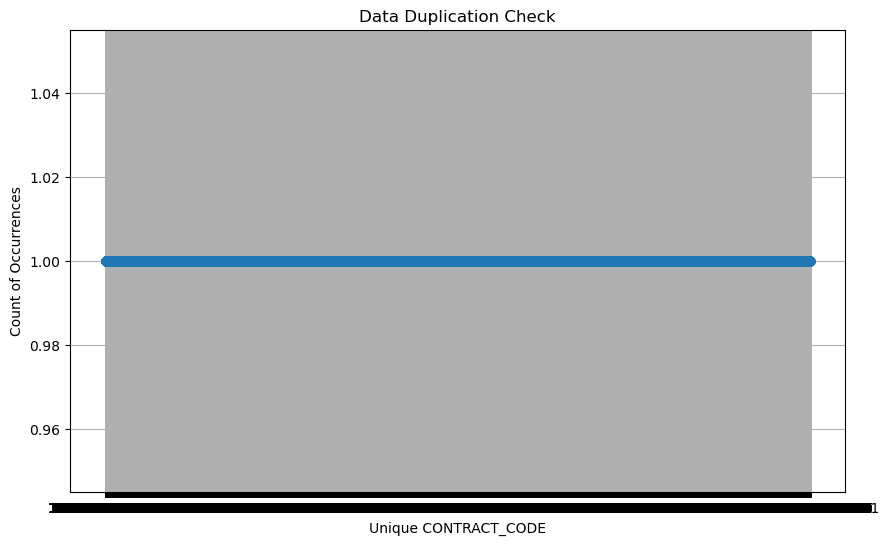

In [6]:
# Check the first few rows of the DataFrame to understand its structure
# print(df.head())

# Assume the unique identifier column is named 'id' (replace with your column name)
# Count occurrences of each unique entry
counts = df['CONTRACT_CODE'].value_counts().sort_index()

# Plotting the line graph
plt.figure(figsize=(10, 6))
plt.plot(counts.index, counts.values, marker='o')
plt.title('Data Duplication Check')
plt.xlabel('Unique CONTRACT_CODE')
plt.ylabel('Count of Occurrences')
plt.grid(True)
plt.show()


## Transforming  SUB, LOS and DOU in to NPL

In [7]:
NPL = "NPL"  # Replace with the actual value you want to assign

df.loc[df.LOAN_STATUS == "LOS", "LOAN_STATUS"] = NPL
df.loc[df.LOAN_STATUS == "SUB", "LOAN_STATUS"] = NPL
df.loc[df.LOAN_STATUS == "DOU", "LOAN_STATUS"] = NPL

In [8]:
df['LOAN_STATUS'].value_counts()

LOAN_STATUS
SET    36956
PAS    33487
NPL     2516
SME      869
Name: count, dtype: int64

In [9]:
df.dtypes

DISTRICTNAME                          object
REGIONNAME                            object
CBE_REGION                            object
BRANCHNAME                            object
CONTRACT_CODE                         object
CUSTOMER_ID                          float64
CO_CODE                                int64
APPROVED_AMOUNT                      float64
GRANT_DATE                    datetime64[ns]
EXPIRY_DATE                   datetime64[ns]
TENURE                                object
TERM                                  object
LOAN_TYPE                             object
LOAN_DESCRIPTION                      object
LOAN_PRODUCT                          object
ARRNGEMENT_ID                         object
RELATIONSHIP_MANAGER                 float64
LTYPE                                 object
CUST_SHORTNAME                        object
LINE_NO                              float64
ACCT_OFFICER_CODE                    float64
DAO_NAME                              object
DAO_CODE  

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73828 entries, 0 to 73827
Data columns (total 48 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   DISTRICTNAME                73828 non-null  object        
 1   REGIONNAME                  73828 non-null  object        
 2   CBE_REGION                  73828 non-null  object        
 3   BRANCHNAME                  73828 non-null  object        
 4   CONTRACT_CODE               73828 non-null  object        
 5   CUSTOMER_ID                 73827 non-null  float64       
 6   CO_CODE                     73828 non-null  int64         
 7   APPROVED_AMOUNT             73795 non-null  float64       
 8   GRANT_DATE                  73800 non-null  datetime64[ns]
 9   EXPIRY_DATE                 71013 non-null  datetime64[ns]
 10  TENURE                      41666 non-null  object        
 11  TERM                        73805 non-null  object    

In [11]:
df.isnull().sum()

DISTRICTNAME                      0
REGIONNAME                        0
CBE_REGION                        0
BRANCHNAME                        0
CONTRACT_CODE                     0
CUSTOMER_ID                       1
CO_CODE                           0
APPROVED_AMOUNT                  33
GRANT_DATE                       28
EXPIRY_DATE                    2815
TENURE                        32162
TERM                             23
LOAN_TYPE                         0
LOAN_DESCRIPTION                 16
LOAN_PRODUCT                      1
ARRNGEMENT_ID                  9421
RELATIONSHIP_MANAGER          73828
LTYPE                             0
CUST_SHORTNAME                    1
LINE_NO                       30971
ACCT_OFFICER_CODE             33654
DAO_NAME                      33654
DAO_CODE                      33654
PROD_CODE                         0
BUSINESS_DATE                     0
PRINCIPAL_OS                  31905
INTEREST_OS                   40256
LOAN_STATUS                 

In [12]:
# Calculate the percentage of missing values for each column
missing_percentage = df.isnull().mean() * 100

# Create a DataFrame to display the results
missing_table = pd.DataFrame({
    'Column': missing_percentage.index,
    'Missing Values (%)': missing_percentage.values
})

# Optional: Set column as index
missing_table.set_index('Column', inplace=True)

# Display the table
print(missing_table)

                            Missing Values (%)
Column                                        
DISTRICTNAME                          0.000000
REGIONNAME                            0.000000
CBE_REGION                            0.000000
BRANCHNAME                            0.000000
CONTRACT_CODE                         0.000000
CUSTOMER_ID                           0.001354
CO_CODE                               0.000000
APPROVED_AMOUNT                       0.044698
GRANT_DATE                            0.037926
EXPIRY_DATE                           3.812917
TENURE                               43.563418
TERM                                  0.031153
LOAN_TYPE                             0.000000
LOAN_DESCRIPTION                      0.021672
LOAN_PRODUCT                          0.001354
ARRNGEMENT_ID                        12.760741
RELATIONSHIP_MANAGER                100.000000
LTYPE                                 0.000000
CUST_SHORTNAME                        0.001354
LINE_NO      

In [13]:
# Calculate the percentage of missing values for each column
missing_percentage = df.isnull().mean() * 100

# Create a DataFrame to display the results
missing_table = pd.DataFrame({
    'Column': missing_percentage.index,
    'Missing Values (%)': missing_percentage.values
})

# Optional: Set column as index
missing_table.set_index('Column', inplace=True)

# Sort the table in descending order by the percentage of missing values
missing_table.sort_values(by='Missing Values (%)', ascending=False, inplace=True)

# Display the table
print(missing_table)

                            Missing Values (%)
Column                                        
RELATIONSHIP_MANAGER                100.000000
INTEREST_RATE                       100.000000
IS_GOVT_BACKED                      100.000000
DATE_RATED                           85.340250
RISK_GRADE                           82.587907
COLLATERAL_VALUE                     57.931950
COLLATTERAL                          57.931950
INTEREST_OS                          54.526738
DAO_CODE                             45.584331
DAO_NAME                             45.584331
ACCT_OFFICER_CODE                    45.584331
ECONOMIC_SECTOR                      43.568836
TENURE                               43.563418
PRINCIPAL_OS                         43.215311
LINE_NO                              41.950209
INSTALLMENT_AMOUNT                   22.672970
TERM_OF_PAYMENT                      12.771577
ARRNGEMENT_ID                        12.760741
LOANID                               10.260335
EXPIRY_DATE  

## missing value by graph

<Axes: >

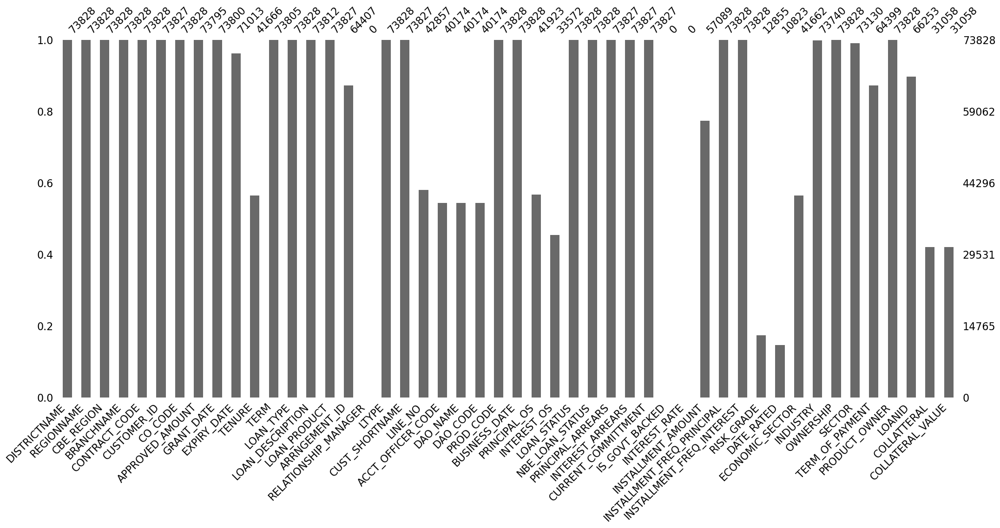

In [14]:
msno.bar(df)

# filling missing value date

#### Using Interpolate
- Interpolate missing values by assuming a linear relationship between existing dates.

In [15]:
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])
df['EXPIRY_DATE'] = df['EXPIRY_DATE'].interpolate()

In [16]:
df['GRANT_DATE'] = pd.to_datetime(df['GRANT_DATE'])
df['GRANT_DATE'] = df['GRANT_DATE'].interpolate()

### using Fill with the Most Frequent Date
- Fill missing values with the most frequently occurring date

In [17]:
most_frequent_date = df['EXPIRY_DATE'].mode()[0]
df['EXPIRY_DATE'].fillna(most_frequent_date, inplace=True)


In [18]:
most_frequent_date = df['GRANT_DATE'].mode()[0]
df['GRANT_DATE'].fillna(most_frequent_date, inplace=True)

## Graphically show the missing values 

<Axes: >

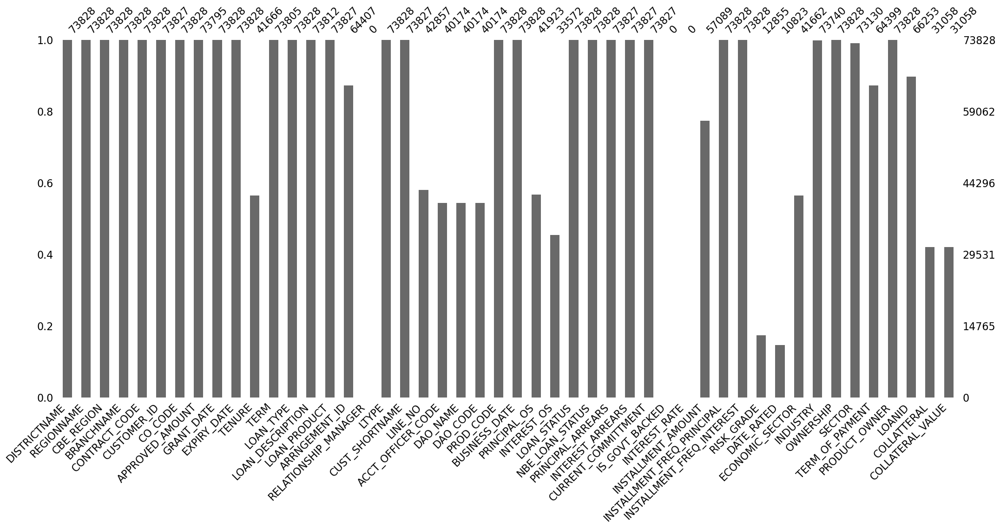

In [19]:
msno.bar(df)

## Deleting Rows or Columns with 100% Missing Values:

In [20]:
# Check for columns with 100% missing values
missing_columns = df.columns[df.isnull().all()]

# Drop columns with 100% missing values
df.drop(columns=missing_columns, inplace=True)

#### Divide data into numeric and catagorical for further data anlasis and preprocessing accordgly 

In [21]:
# Identify numeric columns
numeric_col = df.select_dtypes(include=['number']).columns.tolist()

# Identify categorical columns
categorical_col = df.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

# Print the lists
print("Numeric columns:", numeric_col)
print("Categorical columns:", categorical_col)


Numeric columns: ['CUSTOMER_ID', 'CO_CODE', 'APPROVED_AMOUNT', 'LINE_NO', 'ACCT_OFFICER_CODE', 'DAO_CODE', 'PROD_CODE', 'PRINCIPAL_OS', 'INTEREST_OS', 'PRINCIPAL_ARREARS', 'INTEREST_ARREARS', 'CURRENT_COMMITTMENT', 'INSTALLMENT_AMOUNT', 'INSTALLMENT_FREQ_PRINCIPAL', 'INSTALLMENT_FREQ_INTEREST', 'DATE_RATED', 'COLLATERAL_VALUE']
Categorical columns: ['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME', 'CONTRACT_CODE', 'TENURE', 'TERM', 'LOAN_TYPE', 'LOAN_DESCRIPTION', 'LOAN_PRODUCT', 'ARRNGEMENT_ID', 'LTYPE', 'CUST_SHORTNAME', 'DAO_NAME', 'LOAN_STATUS', 'NBE_LOAN_STATUS', 'RISK_GRADE', 'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT', 'PRODUCT_OWNER', 'LOANID', 'COLLATTERAL']


In [22]:
Categorical_col=['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME', 'CONTRACT_CODE', 'TENURE', 'TERM', 'LOAN_TYPE', 'LOAN_DESCRIPTION', 'LOAN_PRODUCT', 'ARRNGEMENT_ID', 'LTYPE', 'CUST_SHORTNAME', 'DAO_NAME', 'LOAN_STATUS', 'NBE_LOAN_STATUS', 'RISK_GRADE', 'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT', 'PRODUCT_OWNER', 'LOANID', 'COLLATTERAL']

In [23]:
Numeric_col=['CUSTOMER_ID', 'CO_CODE', 'APPROVED_AMOUNT', 'LINE_NO', 'ACCT_OFFICER_CODE', 'DAO_CODE', 'PROD_CODE', 'PRINCIPAL_OS', 'INTEREST_OS', 'PRINCIPAL_ARREARS', 'INTEREST_ARREARS', 'CURRENT_COMMITTMENT', 'INSTALLMENT_AMOUNT', 'INSTALLMENT_FREQ_PRINCIPAL', 'INSTALLMENT_FREQ_INTEREST', 'DATE_RATED', 'COLLATERAL_VALUE']

# filling missing for categorical dataset Using:-

In [24]:
most_frequent = df['TENURE'].mode()[0]
df['TENURE'].fillna(most_frequent, inplace=True)

###  Identify categorical columns

In [25]:
# Identify categorical columns
categorical_columns = df.select_dtypes(include=['object', 'category', 'bool']).columns

####  1. Most Frequent (Mode) Imputation
- Fill missing values with the most frequent category.

In [26]:
for col in categorical_columns:
    df[col] = df[col].fillna(df[col].mode()[0])

#### 2. Fill using forward fill (propagate the next value forward):

In [27]:
for col in categorical_columns:
    df[col] = df[col].fillna(method='ffill')


#### 3. filling missing value using 
- mode
- Bfill
- Ffill
- constant
- interpolate

In [28]:
def fill_missing_values(df, method='mode'):
    """
    Fill missing values in categorical columns using the specified method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    method (str): The method to fill missing values ('mode', 'ffill', 'bfill', 'constant', 'least_frequent', 'interpolate').
    
    Returns:
    pd.DataFrame: The DataFrame with missing values filled.
    """
    for column in df.select_dtypes(include=['object', 'category']).columns:
        if method == 'mode':
            mode_value = df[column].mode()[0]
            df[column].fillna(mode_value, inplace=True)
        elif method == 'ffill':
            df[column].fillna(method='ffill', inplace=True)
        elif method == 'bfill':
            df[column].fillna(method='bfill', inplace=True)
        elif method == 'constant':
            df[column].fillna('Unknown', inplace=True)
        elif method == 'least_frequent':
            least_frequent = df[column].value_counts().idxmin()
            df[column].fillna(least_frequent, inplace=True)
        elif method == 'interpolate' and df[column].dtype.name == 'category':
            # Convert to ordered categorical and interpolate
            df[column] = df[column].cat.add_categories('Missing')
            df[column].fillna('Missing', inplace=True)
            df[column] = df[column].cat.codes.replace(-1, pd.NA).interpolate().astype(int)
            df[column] = pd.Categorical.from_codes(df[column], categories=df[column].cat.categories)
    
    return df

def process_excel_file(file_path, method='mode'):
    """
    Process an Excel file to fill missing values in categorical columns.
    
    Parameters:
    file_path (str): The path to the Excel file.
    method (str): The method to fill missing values ('mode', 'ffill', 'bfill', 'constant', 'least_frequent', 'interpolate').
    
    Returns:
    pd.DataFrame: The processed DataFrame.
    """
    # # Read the Excel file
    # df = pd.read_excel(file_path)
    
    # Fill missing values
    df_filled = fill_missing_values(df, method=method)
    
    return df_filled

# Example usage:
file_path = 'path_to_your_excel_file.xlsx'
method = 'mode'  # You can change this to 'ffill', 'bfill', 'constant', 'least_frequent', or 'interpolate'

# Process the Excel file and get the filled DataFrame
filled_df = process_excel_file(file_path, method=method)

### drop unnessery columns Before starting data cleans and identify the outliour let drop
- delete the columns which not impaort either model development and EDA
- as liturature stated we drop out  those columns

In [29]:
df.drop(['CO_CODE'],axis=1, inplace=True)
df.drop(['LINE_NO'],axis=1, inplace=True)
df.drop(['ARRNGEMENT_ID'],axis=1, inplace=True)
df.drop(['ACCT_OFFICER_CODE'],axis=1, inplace=True)
df.drop(['DAO_CODE'],axis=1, inplace=True)
df.drop(['PROD_CODE'],axis=1, inplace=True)
df.drop(['DATE_RATED'],axis=1, inplace=True)
df.drop(['LOANID'],axis=1, inplace=True)
df.drop(['CUSTOMER_ID'],axis=1, inplace=True)

In [30]:
# ['CUSTOMER_ID', 'CO_CODE', 'APPROVED_AMOUNT', 'LINE_NO', 'ACCT_OFFICER_CODE', 'DAO_CODE', 'PROD_CODE',
#  'PRINCIPAL_OS', 'INTEREST_OS', 'PRINCIPAL_ARREARS', 'INTEREST_ARREARS', 'CURRENT_COMMITTMENT', 
#  'INSTALLMENT_AMOUNT', 'INSTALLMENT_FREQ_PRINCIPAL', 'INSTALLMENT_FREQ_INTEREST', 'DATE_RATED', 
#  'COLLATERAL_VALUE']

# filling missing for Numerical Datasets

#### Identifies numeric columns in the DataFrame.
##### Fills missing values using the specified method:
- 'mean': Fills with the mean of the column.
- 'median': Fills with the median of the column.
- 'mode': Fills with the most frequent value in the column.
- 'ffill': Forward fills missing values.
- 'bfill': Backward fills missing values.
- 'constant': Fills with a constant value (e.g., 0).
- 'knn': Uses K-Nearest Neighbors imputation to fill missing values. The number of neighbors can be specified with n_neighbors.

In [31]:
import pandas as pd
from sklearn.impute import KNNImputer

def fill_missing_numeric_values(df, method='mean', n_neighbors=5):
    """
    Fill missing values in numeric columns using the specified method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    method (str): The method to fill missing values ('mean', 'median', 'mode', 'ffill', 'bfill', 'constant', 'knn').
    n_neighbors (int): Number of neighboring samples to use for KNN imputation (used only if method='knn').
    
    Returns:
    pd.DataFrame: The DataFrame with missing values filled.
    """
    for column in df.select_dtypes(include=['number']).columns:
        if method == 'mean':
            df[column].fillna(df[column].mean(), inplace=True)
        elif method == 'median':
            df[column].fillna(df[column].median(), inplace=True)
        elif method == 'mode':
            df[column].fillna(df[column].mode()[0], inplace=True)
        elif method == 'ffill':
            df[column].fillna(method='ffill', inplace=True)
        elif method == 'bfill':
            df[column].fillna(method='bfill', inplace=True)
        elif method == 'constant':
            df[column].fillna(0, inplace=True)  # Replace 0 with any constant value you prefer
        elif method == 'knn':
            imputer = KNNImputer(n_neighbors=n_neighbors)
            df[df.select_dtypes(include=['number']).columns] = imputer.fit_transform(df.select_dtypes(include=['number']))
    
    return df

def process_excel_file(file_path, method='mean', n_neighbors=5):
    """
    Process an Excel file to fill missing values in numeric columns.
    
    Parameters:
    file_path (str): The path to the Excel file.
    method (str): The method to fill missing values ('mean', 'median', 'mode', 'ffill', 'bfill', 'constant', 'knn').
    n_neighbors (int): Number of neighboring samples to use for KNN imputation (used only if method='knn').
    
    Returns:
    pd.DataFrame: The processed DataFrame.
    """
    # # Read the Excel file
    # df = pd.read_excel(file_path)
    
    # Fill missing values in numeric columns
    df_filled = fill_missing_numeric_values(df, method=method, n_neighbors=n_neighbors)
    
    return df_filled

# Example usage:
file_path = 'path_to_your_excel_file.xlsx'
method = 'knn'  # You can change this to 'mean', 'median', 'mode', 'ffill', 'bfill', 'constant', or 'knn'
n_neighbors = 5  # Number of neighbors for KNN imputation

# Process the Excel file and get the filled DataFrame
filled_df = process_excel_file(file_path, method=method, n_neighbors=n_neighbors)

## AFter Fillging Missing values 

<Axes: >

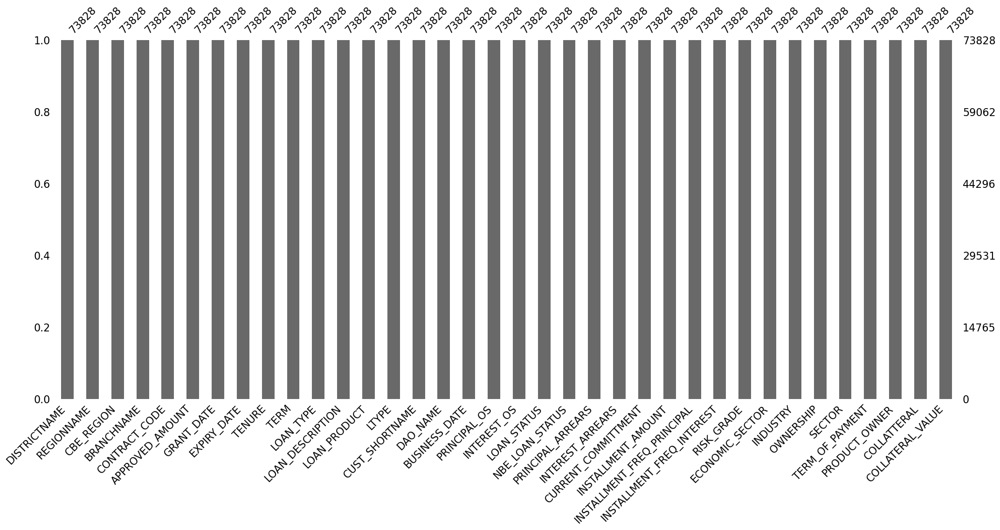

In [32]:
msno.bar(df)

# Identify the outlier form numerical datasets
 

### Visualizes outliers using three types of plots:
- Box Plot: Helps to visualize the distribution of the data and identify outliers.
- Histogram: Shows the frequency distribution of the data and can indicate the presence of outliers.
- Scatter Plot: Used to visualize the relationship between two numeric columns. If there's only one numeric column, it skips this plot.

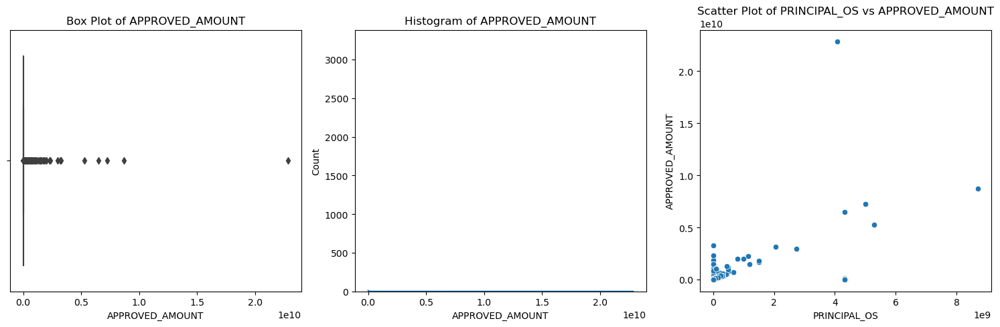

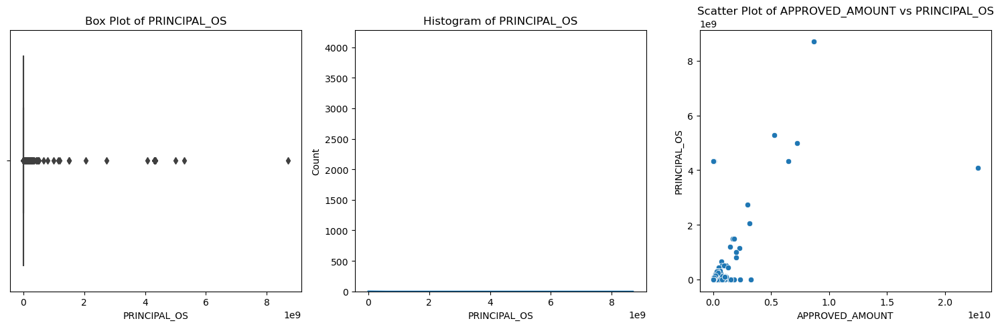

In [ ]:
def visualize_outliers(df):
    """
    Visualize outliers in numeric columns using box plots, scatter plots, and histograms.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    
    Returns:
    None
    """
    numeric_columns = df.select_dtypes(include=['number']).columns

    for column in numeric_columns:
        plt.figure(figsize=(15, 5))

        # Box plot
        plt.subplot(1, 3, 1)
        sns.boxplot(x=df[column])
        plt.title(f'Box Plot of {column}')

        # Histogram
        plt.subplot(1, 3, 2)
        sns.histplot(df[column], kde=True)
        plt.title(f'Histogram of {column}')

        # Scatter plot (if there's another numeric column to pair with)
        if len(numeric_columns) > 1:
            plt.subplot(1, 3, 3)
            for other_column in numeric_columns:
                if other_column != column:
                    sns.scatterplot(x=df[other_column], y=df[column])
                    plt.title(f'Scatter Plot of {other_column} vs {column}')
                    break

        plt.tight_layout()
        plt.show()

def process_excel_file(file_path):
    """
    Process an Excel file to identify numeric columns and visualize outliers.
    
    Parameters:
    file_path (str): The path to the Excel file.
    
    Returns:
    pd.DataFrame: The DataFrame read from the Excel file.
    """
    # # Read the Excel file
    # df = pd.read_excel(file_path)
    
    # Visualize outliers in numeric columns
    visualize_outliers(df)
    
    return df

# Example usage:
file_path = 'path_to_your_excel_file.xlsx'

# Process the Excel file and visualize outliers
df = process_excel_file(file_path)

print("Outliers in numeric columns have been visualized.")


## Identifies numeric columns in the DataFrame.
#### Detects outliers using the specified method:
- 'z_score': Uses the Z-score method to detect outliers. A Z-score above the threshold (default 3) is considered an outlier.
- 'iqr': Uses the Interquartile Range (IQR) method to detect outliers. Values outside 1.5 times the IQR below the first quartile (Q1) or above the third quartile (Q3) are considered outliers.

In [ ]:
import pandas as pd
from scipy import stats

def detect_outliers(df, method='z_score', threshold=3):
    """
    Detect outliers in numeric columns using the specified method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    method (str): The method to detect outliers ('z_score', 'iqr').
    threshold (float): The threshold for detecting outliers (used for 'z_score' method).
    
    Returns:
    dict: A dictionary with column names as keys and indices of outliers as values.
    """
    outliers = {}
    
    for column in df.select_dtypes(include=['number']).columns:
        if method == 'z_score':
            z_scores = stats.zscore(df[column].dropna())
            outlier_indices = df[column][abs(z_scores) > threshold].index.tolist()
            outliers[column] = outlier_indices
        elif method == 'iqr':
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            outlier_indices = df[(df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR))].index.tolist()
            outliers[column] = outlier_indices
    
    return outliers

def process_excel_file(file_path, method='z_score', threshold=3):
    """
    Process an Excel file to detect outliers in numeric columns.
    
    Parameters:
    file_path (str): The path to the Excel file.
    method (str): The method to detect outliers ('z_score', 'iqr').
    threshold (float): The threshold for detecting outliers (used for 'z_score' method).
    
    Returns:
    pd.DataFrame: The DataFrame with an additional column indicating outliers.
    dict: A dictionary with column names as keys and indices of outliers as values.
    """
    # # Read the Excel file
    # df = pd.read_excel(file_path)
    
    # Detect outliers in numeric columns
    outliers = detect_outliers(df, method=method, threshold=threshold)
    
    # Add an 'Outliers' column to indicate outliers
    df['Outliers'] = False
    for indices in outliers.values():
        df.loc[indices, 'Outliers'] = True
    
    return df, outliers

# Example usage:
file_path = 'path_to_your_excel_file.xlsx'
method = 'z_score'  # You can change this to 'iqr'
threshold = 3  # Threshold for Z-score method

# Process the Excel file and get the DataFrame with outliers marked
df_with_outliers, outliers_dict = process_excel_file(file_path, method=method, threshold=threshold)

# Save the DataFrame back to an Excel file
df_with_outliers.to_excel('outliers_detected_excel_file.xlsx', index=False)

print("Outliers in numeric columns have been detected and saved to 'outliers_detected_excel_file.xlsx'.")
print("Outliers detected in columns:", outliers_dict)

## Save Cleand dataset

In [ ]:
# Save the cleaned DataFrame back to an Excel file
# df.to_excel('D:/CBE_project_Title/LOAN WITH COLLATERAL/cleaned_data.xlsx', index=False)

## Detects  and remove outliers using the specified method:
- 'z_score': Uses the Z-score method to detect outliers. A Z-score above the threshold (default 3) is considered an outlier.
- 'Inter quartel range': Uses the Interquartile Range (IQR) method to detect outliers. Values outside 1.5 times the IQR below the first quartile (Q1) or above the third quartile (Q3) are considered outliers.
### outlier datection and removale using Inter quartel range

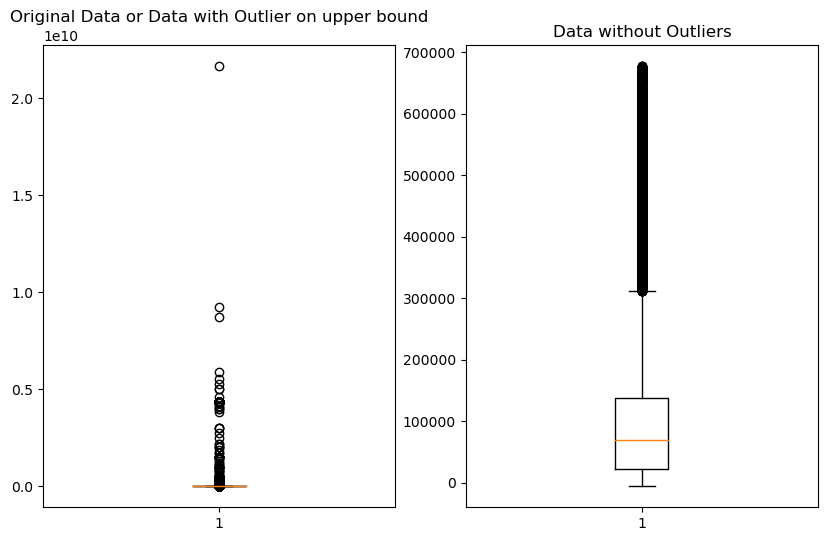

In [31]:
# Specify the column for which you want to remove outliers
column_name = 'PRINCIPAL_OS'  # Replace with the name of your specific column

# Calculate the IQR (Interquartile Range)
Q1 = df[column_name].quantile(0.25)
Q3 = df[column_name].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers and create a new DataFrame without outliers
df_no_outliers = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

# Visualize the original and filtered data using a boxplot
plt.figure(figsize=(10, 6))

# Boxplot for the original data
plt.subplot(1, 2, 1)
plt.boxplot(df[column_name])
plt.title('Original Data or Data with Outlier on upper bound')

# Boxplot for the data without outliers
plt.subplot(1, 2, 2)
plt.boxplot(df_no_outliers[column_name])
plt.title('Data without Outliers')

plt.show()

### Outlier detections Z-score

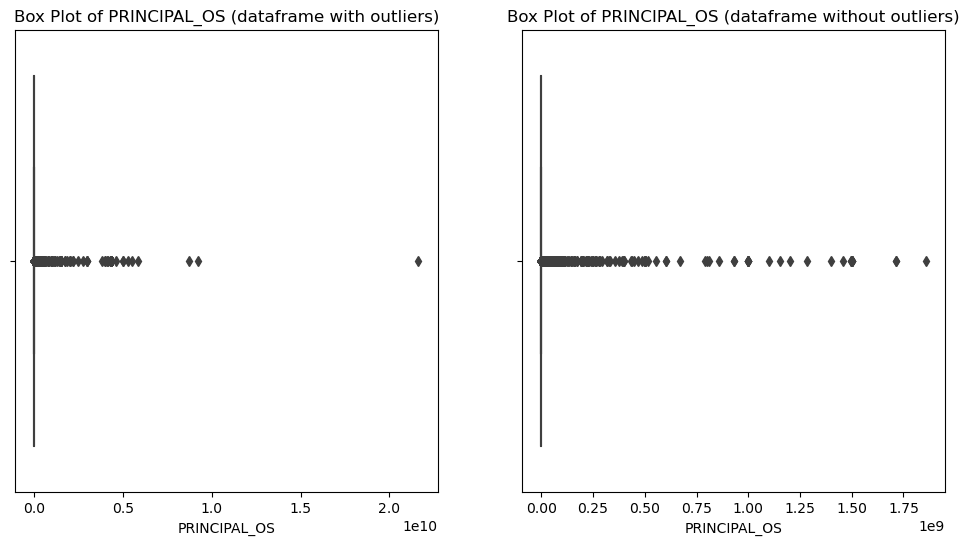

In [32]:
# Specify the column from which you want to remove outliers
column_name = 'PRINCIPAL_OS'

# Calculate Z-scores for the specified column
z_scores = np.abs((df[column_name] - df[column_name].mean()) / df[column_name].std())

# Set a Z-score threshold (e.g., 3)
threshold = 1

# Identify and remove outliers
df_no_outliers = df[z_scores < threshold]

# Visualize the data before and after removing outliers using a box plot
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=df[column_name])
plt.title(f'Box Plot of {column_name} (dataframe with outliers)')

plt.subplot(1, 2, 2)
sns.boxplot(x=df_no_outliers[column_name])
plt.title(f'Box Plot of {column_name} (dataframe without outliers)')

plt.show()

# Explanatory data analytics (EDA) 

## Catagorical data analysis   

#### show distrbution credit accros the country on map
- from Region name we extract the latitude and longitude
- from Geopspatial data we extract shapes 
- we view the disribution of credit on contry 
- identfy which region is mostly take credit and why

Loaded dataset with 13 rows and 4 columns
    REGIONNAME LOAN_STATUS   Latitude  Longitude
0  ADDIS ABABA         SME   9.000000  38.766670
1         AFAR         NPL  11.795640  41.003586
2       AMHARA         SET  11.500000  37.500000
3    DIRE DAWA         PAS   9.593100  41.866100
4     GAMBELLA         SME   7.810265  34.580500
Dropped 0 rows due to failed geocoding
Dataset after geocoding with 13 rows
    REGIONNAME LOAN_STATUS   Latitude  Longitude
0  ADDIS ABABA         SME   9.000000  38.766670
1         AFAR         NPL  11.795640  41.003586
2       AMHARA         SET  11.500000  37.500000
3    DIRE DAWA         PAS   9.593100  41.866100
4     GAMBELLA         SME   7.810265  34.580500


C:\Users\Daveee\AppData\Local\Temp\ipykernel_6264\3588475494.py:54: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


Plotting SME with 3 records
Plotting NPL with 4 records
Plotting SET with 3 records
Plotting PAS with 3 records


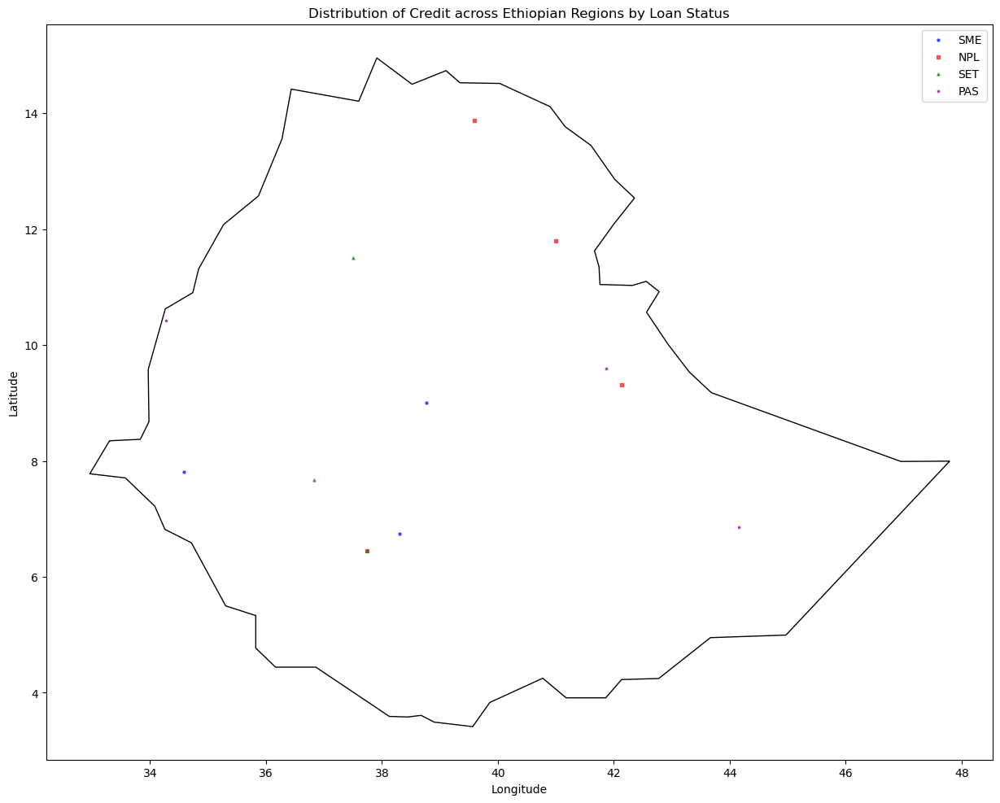

In [39]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# # Load the loan dataset from an Excel file
# loan_file_path = 'loan_dataset.xlsx'  # Replace with the path to your loan dataset
# df = pd.read_excel(loan_file_path)

# Check the dataset
print(f"Loaded dataset with {df.shape[0]} rows and {df.shape[1]} columns")
print(df.head())

# Predefined dictionary of regions with their latitudes and longitudes
region_coordinates = {
    'ADDIS ABABA': (8.99999999940141, 38.76667),
    'AFAR': (11.79564, 41.003586),
    'AMHARA': (11.49999999953709, 37.5),
    'DIRE DAWA': (9.5931, 41.8661),
    'GAMBELLA': (7.810264699391271, 34.5805),
    'HARARI': (9.307, 42.135),
    'OROMIYA': (7.672164399392472, 36.835),
    'SOMALI': (6.857, 44.157),
    'South Ethiopia': (6.453652499423955, 37.742),
    'TIGRAY': (13.881272999776511, 39.6012),
    'CENTAL ETHIOPIA': (6.453652499423955, 37.742),
    'BENSHANGUL GUMUZ': (10.42673, 34.28),
    'SIDAMA': (6.7371751, 38.3),
    'SOUTH WEST ETHIOPIA': (6.453652499423955, 37.742),  # Example coordinates for South West Ethiopia
}

# Function to get latitude and longitude from region name
def get_lat_lon(region):
    region = region.strip().upper()
    return region_coordinates.get(region, (None, None))

# Apply the function to get latitudes and longitudes
df['Latitude'], df['Longitude'] = zip(*df['REGIONNAME'].apply(get_lat_lon))

# Drop rows where geocoding failed
initial_row_count = df.shape[0]
df.dropna(subset=['Latitude', 'Longitude'], inplace=True)
dropped_row_count = initial_row_count - df.shape[0]
print(f"Dropped {dropped_row_count} rows due to failed geocoding")

# Check the dataset after geocoding
print(f"Dataset after geocoding with {df.shape[0]} rows")
print(df.head())

# Create a GeoDataFrame from the loan DataFrame
loan_gdf = gpd.GeoDataFrame(df, geometry=[Point(xy) for xy in zip(df.Longitude, df.Latitude)])

# Load a world map shapefile (this will include Ethiopia)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter for Ethiopia
ethiopia = world[world.name == "Ethiopia"]

# Plot the map
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ethiopia.plot(ax=ax, color='white', edgecolor='black')

# Define loan statuses and corresponding colors for better visualization
LOAN_STATUS = df['LOAN_STATUS'].unique()
colors = ['blue', 'red', 'green', 'purple', 'orange', 'yellow', 'cyan', 'magenta', 'brown', 'pink'][:len(LOAN_STATUS)]
markers = ['o', 's', '^', '*', 'P', 'X', 'D', 'v', 'H', '<'][:len(LOAN_STATUS)]

# Plot each loan status as a separate layer with different colors and markers
for status, color, marker in zip(LOAN_STATUS, colors, markers):
    status_data = loan_gdf[loan_gdf['LOAN_STATUS'] == status]
    print(f"Plotting {status} with {status_data.shape[0]} records")
    status_data.plot(ax=ax, marker=marker, color=color, markersize=5, label=status, alpha=0.6)

# Add legend
plt.legend()

# Add titles and labels
plt.title('Distribution of Credit across Ethiopian Regions by Loan Status')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


C:\Users\Daveee\AppData\Local\Temp\ipykernel_3312\1612266612.py:43: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


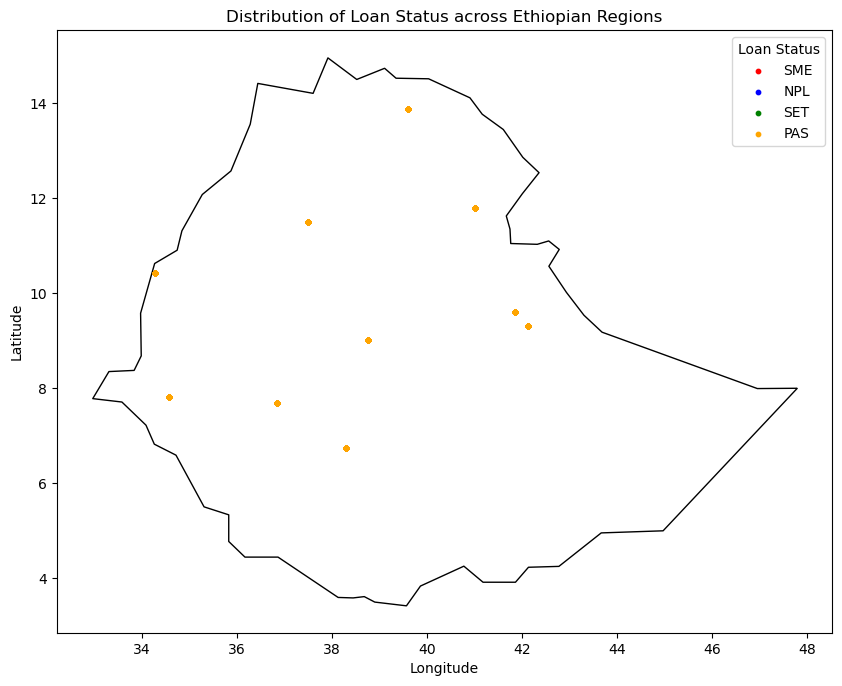

In [34]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Load the loan dataset from an Excel file
# loan_file_path = 'loan_dataset.xlsx'  # Replace with the path to your loan dataset
# df = pd.read_excel(loan_file_path)

# Predefined dictionary of regions with their latitudes and longitudes
region_coordinates = {
    'ADDIS ABABA': (8.99999999940141, 38.76667),
    'AFAR': (11.79564, 41.003586),
    'AMHARA': (11.49999999953709, 37.5),
    'DIRE DAWA': (9.5931, 41.8661),
    'GAMBELLA': (7.810264699391271, 34.5805),
    'HARARI': (9.307, 42.135),
    'OROMIYA': (7.672164399392472, 36.835),
    'SOMALI': (6.857, 44.157),
    'South Ethiopia': (6.453652499423955, 37.742),
    'TIGRAY': (13.881272999776511, 39.6012),
    'CENTRAL ETHIOPIA': (6.453652499423955, 37.742),
    'BENSHANGUL GUMUZ': (10.42673, 34.28),
    'SIDAMA': (6.7371751, 38.3),
    'SOUTH WEST ETHIOPIA': (6.453652499423955, 37.742),  # Example coordinates for South West Ethiopia
}

# Function to get latitude and longitude from region name
def get_lat_lon(region):
    region = region.strip().upper()
    return region_coordinates.get(region, (None, None))

# Apply the function to get latitudes and longitudes
df['Latitude'], df['Longitude'] = zip(*df['REGIONNAME'].apply(get_lat_lon))

# Drop rows where geocoding failed
df.dropna(subset=['Latitude', 'Longitude'], inplace=True)

# Create a GeoDataFrame from the loan DataFrame
loan_gdf = gpd.GeoDataFrame(df, geometry=[Point(xy) for xy in zip(df.Longitude, df.Latitude)])

# Load a world map shapefile (this will include Ethiopia)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter for Ethiopia
ethiopia = world[world.name == "Ethiopia"]

# Plot the map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ethiopia.plot(ax=ax, color='white', edgecolor='black')

# Define loan statuses and corresponding colors
LOAN_STATUS = ['SME', 'NPL', 'SET', 'PAS']
colors = ['red', 'blue', 'green', 'orange']
status_color_map = dict(zip(LOAN_STATUS, colors))

# Plot each loan status as a separate layer with different colors
for status in LOAN_STATUS:
    status_data = loan_gdf[loan_gdf['LOAN_STATUS'] == status]
    status_data.plot(ax=ax, marker='o', color=status_color_map[status], markersize=10, label=status, linestyle='None')

# Add legend
plt.legend(title='Loan Status')

# Add titles and labels
plt.title('Distribution of Loan Status across Ethiopian Regions')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

# REGIONNAME vs LOAN_STATUS
- Addis Ababa SET and PAS highly
- next to AA Oromia 
- next to Oromia  Amhara is higly PAS and SET loan
- NPL is higher in tigray region

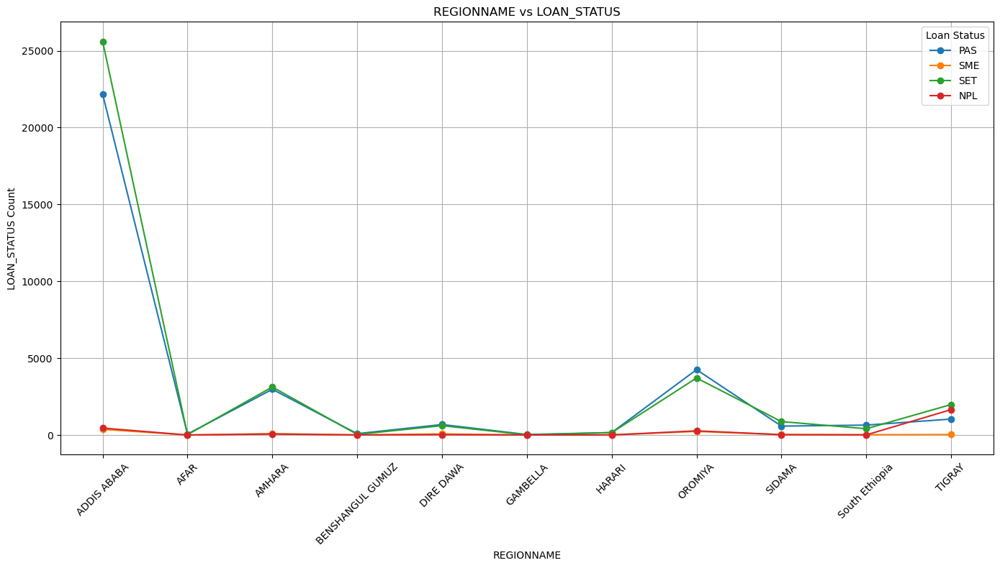

In [37]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='REGIONNAME', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
plt.figure(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        plt.plot(pivot_df['REGIONNAME'], pivot_df[status], marker='o', linestyle='-', label=status)

plt.xlabel('REGIONNAME')
plt.ylabel('LOAN_STATUS Count')
plt.title('REGIONNAME vs LOAN_STATUS')
plt.xticks(rotation=45)
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()
plt.show()

# REGIONNAME vs LOAN_STATUS by parcnetage 

In [38]:
# Calculate the count of each loan status per region
loan_status_counts = df.groupby(['REGIONNAME', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Calculate the total number of loans per region
total_loans_per_region = loan_status_counts.sum(axis=1)

# Calculate the percentage distribution of each loan status per region
loan_status_percentages = loan_status_counts.div(total_loans_per_region, axis=0) * 100

# Print the resulting DataFrame
print(loan_status_percentages)

LOAN_STATUS             NPL        PAS        SET       SME
REGIONNAME                                                 
ADDIS ABABA        0.928308  45.629130  52.691271  0.751292
AFAR               0.000000  73.750000  26.250000  0.000000
AMHARA             0.960615  47.598463  50.016010  1.424912
BENSHANGUL GUMUZ   3.759398  64.661654  28.571429  3.007519
DIRE DAWA          1.307190  49.382716  44.153958  5.156137
GAMBELLA           6.818182  70.454545  22.727273  0.000000
HARARI             0.923077  48.615385  47.692308  2.769231
OROMIYA            3.191489  50.248227  43.829787  2.730496
SIDAMA             1.535381  38.651535  58.210948  1.602136
South Ethiopia     0.558140  59.813953  37.860465  1.767442
TIGRAY            35.143770  22.066028  42.172524  0.617678


# List of Destrict which is highly SET and PAS loans
- consumer east addis 
- central addis consumer
# List of Destrict which is highly SET and PAS loans
- wolitya sodo
- yeka

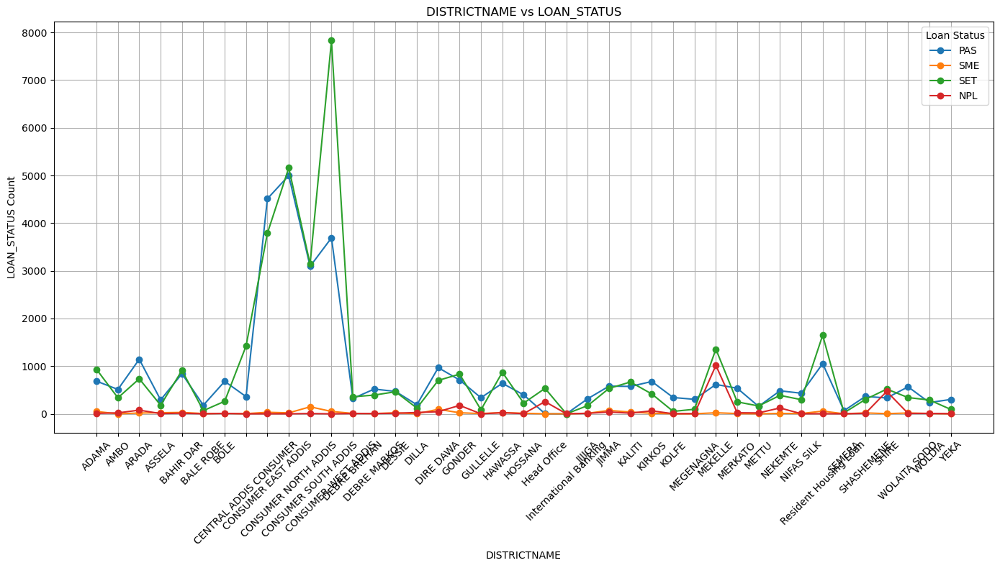

In [33]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='DISTRICTNAME', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
plt.figure(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        plt.plot(pivot_df['DISTRICTNAME'], pivot_df[status], marker='o', linestyle='-', label=status)

plt.xlabel('DISTRICTNAME')
plt.ylabel('LOAN_STATUS Count')
plt.title('DISTRICTNAME vs LOAN_STATUS')
plt.xticks(rotation=45)
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()
plt.show()

## After Data incositancy or inaccuarte issues were solved 
- head office is  SET loan
- hossena is PAS highly loa

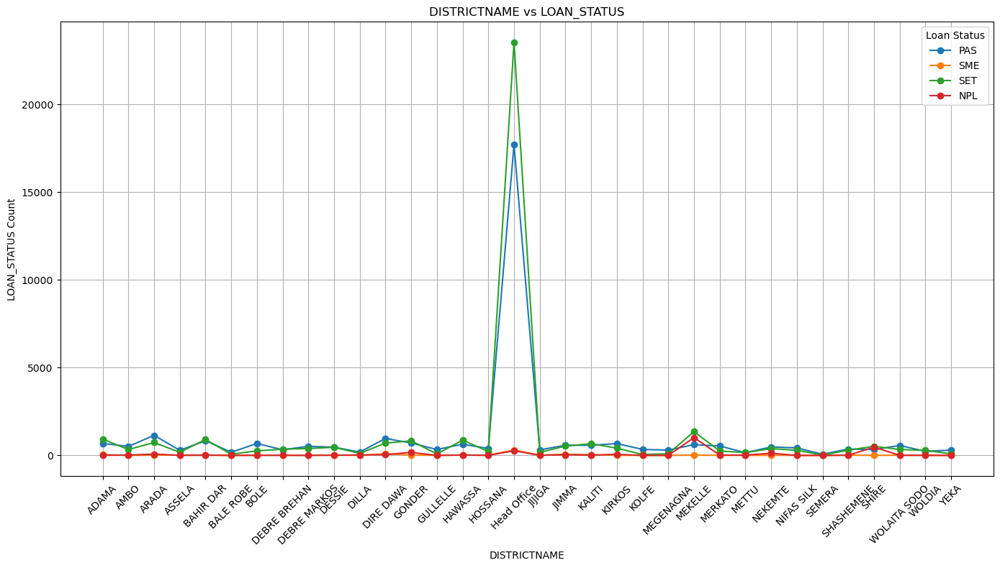

In [31]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='DISTRICTNAME', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
plt.figure(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        plt.plot(pivot_df['DISTRICTNAME'], pivot_df[status], marker='o', linestyle='-', label=status)

plt.xlabel('DISTRICTNAME')
plt.ylabel('LOAN_STATUS Count')
plt.title('DISTRICTNAME vs LOAN_STATUS')
plt.xticks(rotation=45)
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()
plt.show()

## CBE_REGION
- realtvely centarl region highy in terms SET and Pass
- in North east region ther high number of loan which NPL

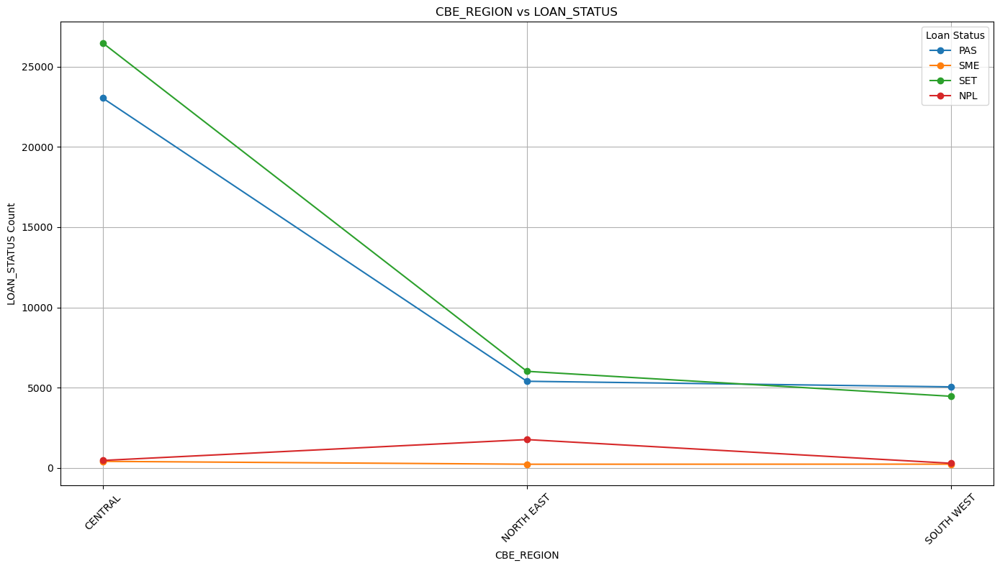

In [34]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='CBE_REGION', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
plt.figure(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        plt.plot(pivot_df['CBE_REGION'], pivot_df[status], marker='o', linestyle='-', label=status)

plt.xlabel('CBE_REGION')
plt.ylabel('LOAN_STATUS Count')
plt.title('CBE_REGION vs LOAN_STATUS')
plt.xticks(rotation=45)
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()
plt.show()

## BRANCHNAME
### good loan status and bad
#### good
- 
- 
#### Bad
- 
- 

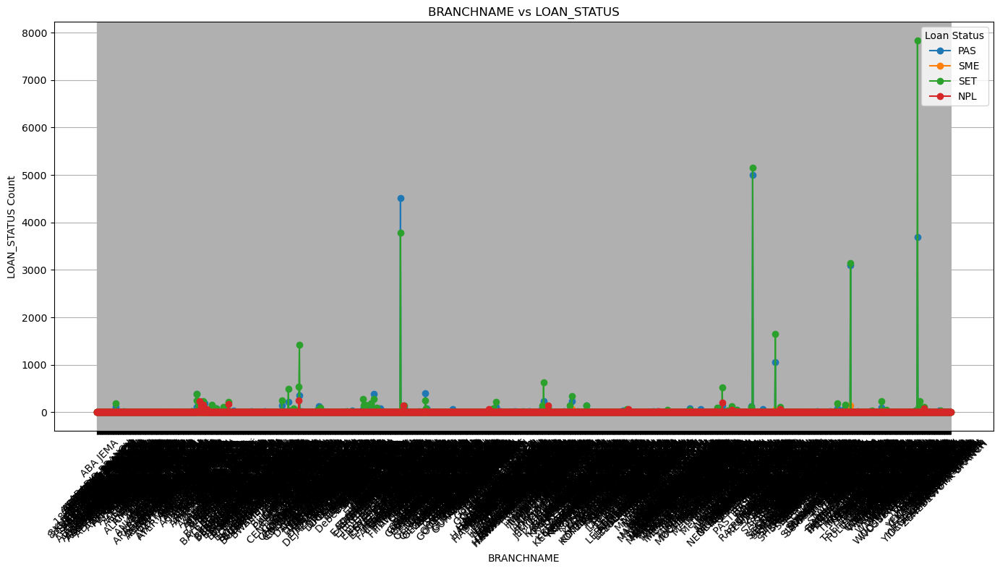

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import mplcursors

# # Load the data from the XLSX file
# df = pd.read_excel('your_file.xlsx')

# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='BRANCHNAME', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['BRANCHNAME'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('BRANCHNAME')
ax.set_ylabel('LOAN_STATUS Count')
ax.set_title('BRANCHNAME vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## BRANCHNAME by parcnetage of Loan Status 

In [49]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['BRANCHNAME', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Display the results
print("Percentage of LOAN_STATUS for each BRANCHNAME:\n")
print(loan_status_percentages.to_string(float_format="%.2f"))

Percentage of LOAN_STATUS for each BRANCHNAME:

LOAN_STATUS               NPL    PAS    SET   SME
BRANCHNAME                                       
18 ADEBABAY BRANCH       0.00 100.00   0.00  0.00
3KUTIR MAZORIA BRANCH    0.00  92.86   7.14  0.00
41 EYESUS BRANCH         0.00 100.00   0.00  0.00
8 KUTIR MAZORIA BRANCH   0.00 100.00   0.00  0.00
ABA BOKA BRANCH          0.00 100.00   0.00  0.00
ABA BUNA BRANCH          0.00 100.00   0.00  0.00
ABA FASILO BRANCH        0.00 100.00   0.00  0.00
ABA JEMA                 0.00 100.00   0.00  0.00
ABA SENA BRANCH          0.00  50.00  50.00  0.00
ABA TATEK BRANCH         0.00 100.00   0.00  0.00
ABADIR BRANCH            0.00 100.00   0.00  0.00
ABADO CONDOMINIUM BR     0.00 100.00   0.00  0.00
ABAGETYE BRANCH          0.00  50.00  50.00  0.00
ABAJALE BRANCH           0.00  44.44  55.56  0.00
ABALA ABAYA BRANCH       0.00 100.00   0.00  0.00
ABALLA BRANCH           20.00  80.00   0.00  0.00
ABARRO BRANCH            0.00  63.64  36.36  0.00
AB

### Selects 100% PAS and 100% SET while PAS and SET <50%

In [121]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['BRANCHNAME', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Filter sectors with 100% SET and 100% PAS or less than 25% SET and PAS
filtered_df = loan_status_percentages[
    ((loan_status_percentages['SET'] == 100) & (loan_status_percentages['PAS'] == 100)) |
     ((loan_status_percentages['SET'] < 10) | (loan_status_percentages['PAS'] < 10))
]

# Display the results
print("Filtered Percentage of LOAN_STATUS for each BRANCHNAME:\n")
print(filtered_df.to_string(float_format="%.2f"))


Filtered Percentage of LOAN_STATUS for each BRANCHNAME:

LOAN_STATUS               NPL    PAS    SET   SME
BRANCHNAME                                       
18 ADEBABAY BRANCH       0.00 100.00   0.00  0.00
3KUTIR MAZORIA BRANCH    0.00  92.86   7.14  0.00
41 EYESUS BRANCH         0.00 100.00   0.00  0.00
8 KUTIR MAZORIA BRANCH   0.00 100.00   0.00  0.00
ABA BOKA BRANCH          0.00 100.00   0.00  0.00
ABA BUNA BRANCH          0.00 100.00   0.00  0.00
ABA FASILO BRANCH        0.00 100.00   0.00  0.00
ABA JEMA                 0.00 100.00   0.00  0.00
ABA TATEK BRANCH         0.00 100.00   0.00  0.00
ABADIR BRANCH            0.00 100.00   0.00  0.00
ABADO CONDOMINIUM BR     0.00 100.00   0.00  0.00
ABALA ABAYA BRANCH       0.00 100.00   0.00  0.00
ABALLA BRANCH           20.00  80.00   0.00  0.00
ABAYA BRANCH             0.00 100.00   0.00  0.00
ABE DONGORO BRANCH       0.00 100.00   0.00  0.00
ABEBE BIKILA BRANCH      0.00 100.00   0.00  0.00
ABEBECH GOBENA BRANCH    0.00 100.00   0.00

## TENURE
- long Term highly SET
- relativley Pass the from long, Medim and Short term decraseing 

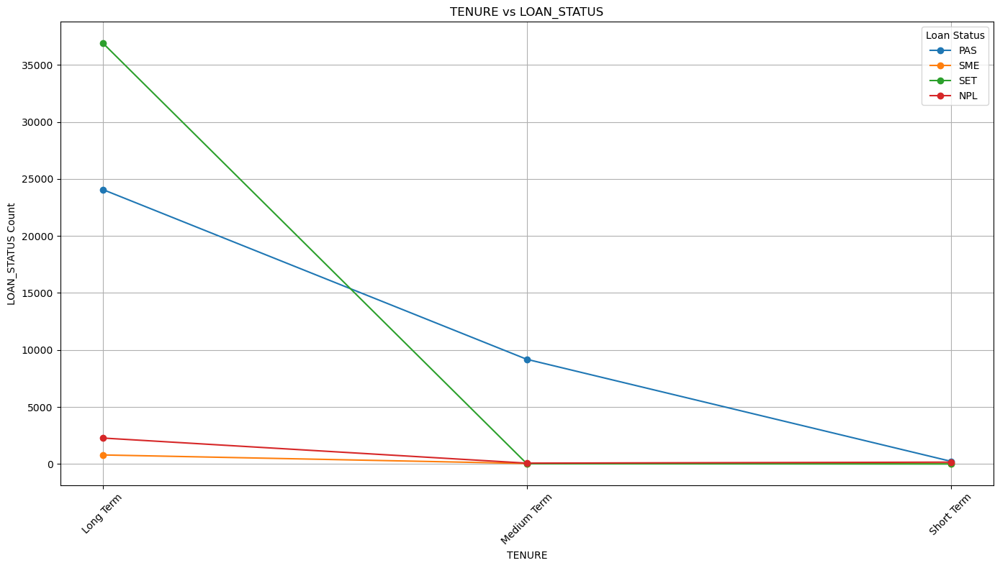

In [51]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='TENURE', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['TENURE'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('TENURE')
ax.set_ylabel('LOAN_STATUS Count')
ax.set_title('TENURE vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## TERM
- most long term loan SET
- most long term loan PAS
- short term loan also PAS

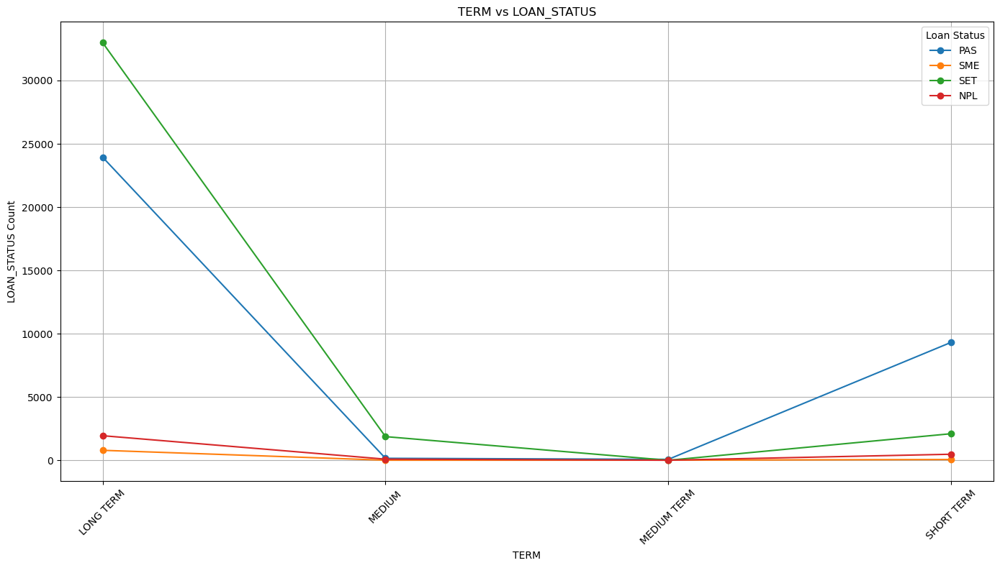

In [52]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='TERM', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['TERM'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('TERM')
ax.set_ylabel('LOAN_STATUS Count')
ax.set_title('TERM vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## LOAN_TYPE
- TL loan_type highly SET and also PAS
- IFB, GB, MLand AL type of loan reamin the same in all Loan Status

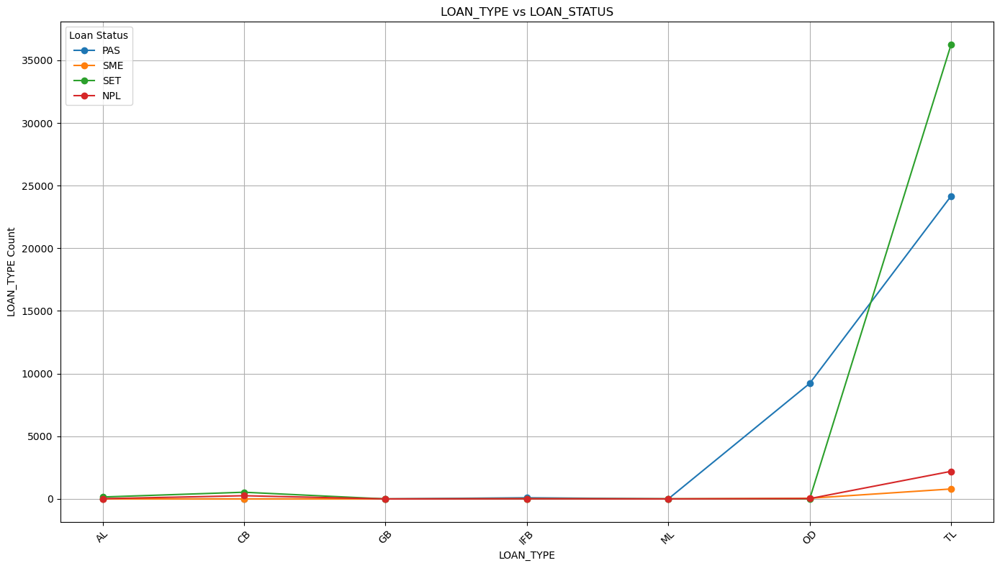

In [53]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='LOAN_TYPE', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['LOAN_TYPE'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('LOAN_TYPE')
ax.set_ylabel('LOAN_TYPE Count')
ax.set_title('LOAN_TYPE vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## LTYPE
- AA LTYPE is highly SET and Pass 
- OD also PAS well
- while LA and LD remains the same in the whole Aspects (LOAN_STATUS)

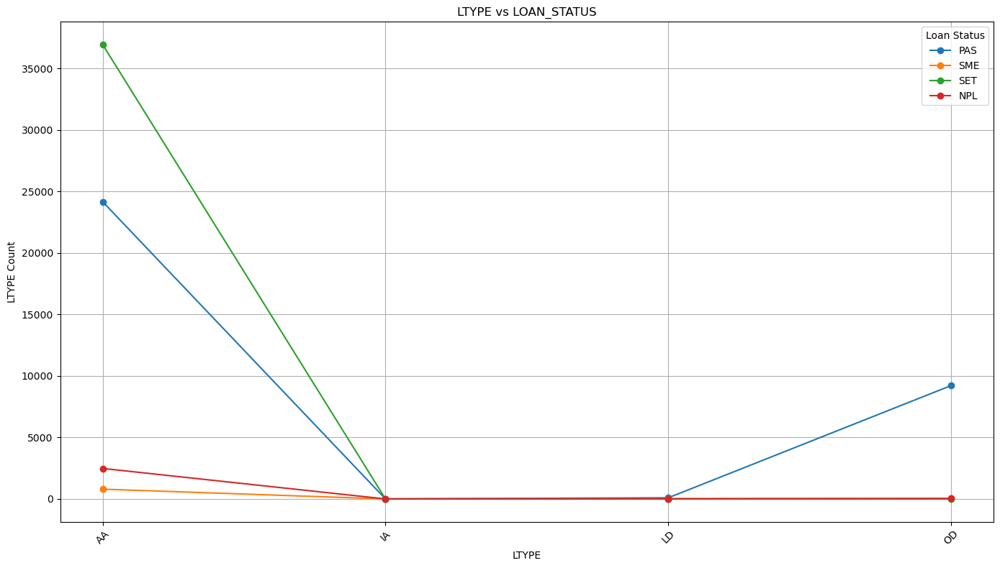

In [35]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='LTYPE', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['LTYPE'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('LTYPE')
ax.set_ylabel('LTYPE Count')
ax.set_title('LTYPE vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## LOAN_DESCRIPTION
- most Agricultural inverstment products Loan are SET and also PAS
- Special Staff loan are SET
- Staff personal Loan



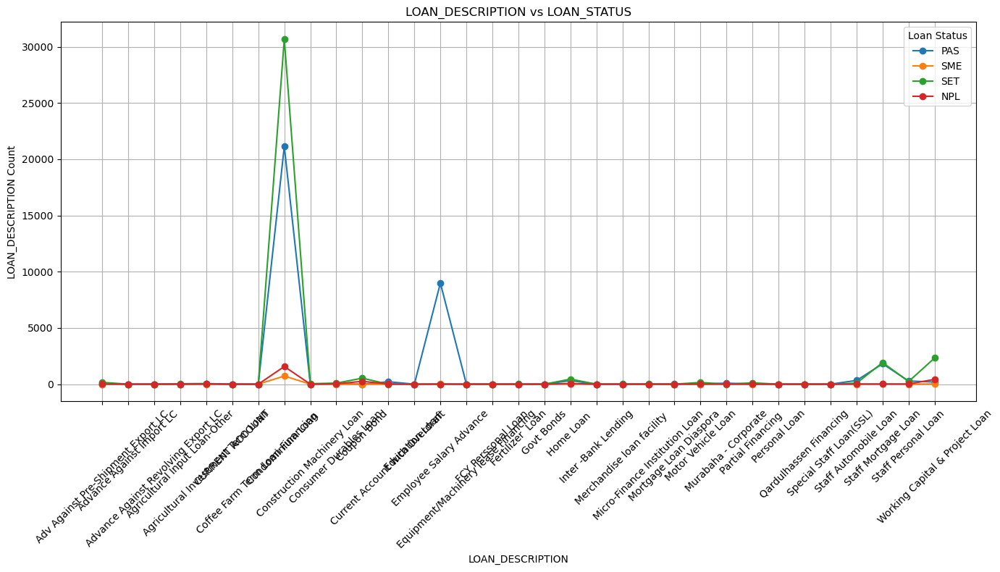

In [54]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='LOAN_DESCRIPTION', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['LOAN_DESCRIPTION'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('LOAN_DESCRIPTION')
ax.set_ylabel('LOAN_DESCRIPTION Count')
ax.set_title('LOAN_DESCRIPTION vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## LOAN_PRODUCT
- coffee term fin laon products are highly SET
- condo. 1 BED laon products are highly SET
- NREV.preseve highly PAS

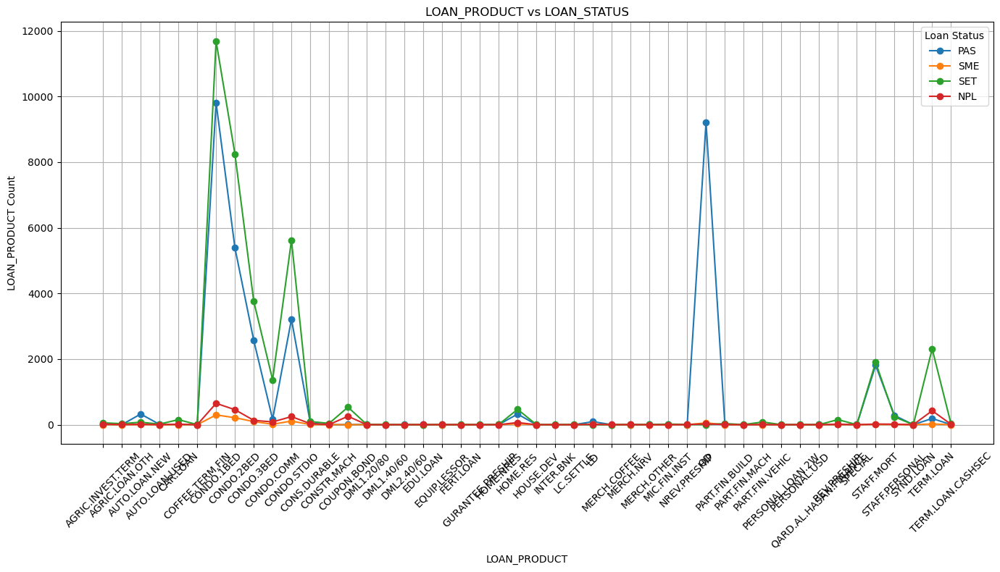

In [55]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='LOAN_PRODUCT', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['LOAN_PRODUCT'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('LOAN_PRODUCT')
ax.set_ylabel('LOAN_PRODUCT Count')
ax.set_title('LOAN_PRODUCT vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## DAO_NAME
- 

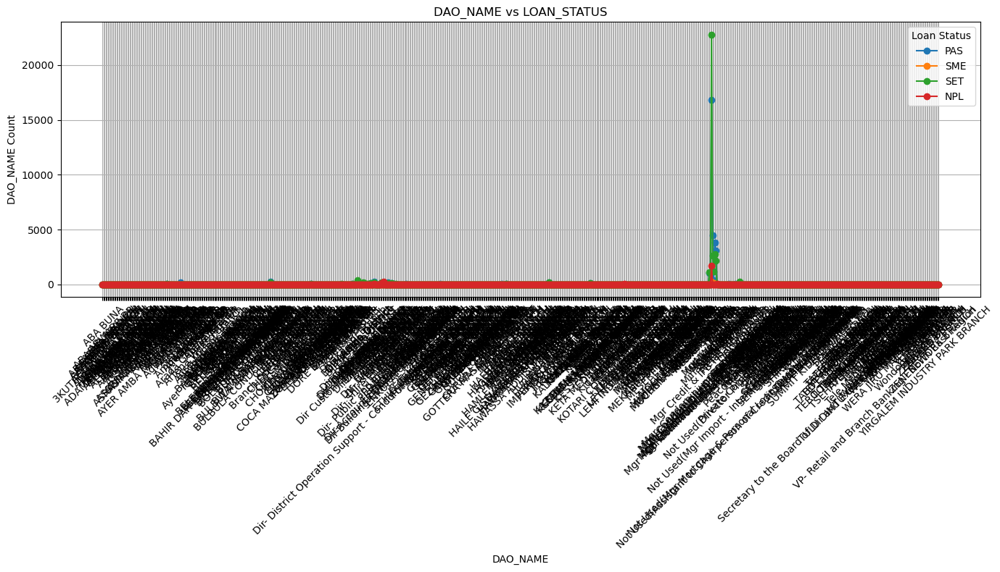

In [40]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='DAO_NAME', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['DAO_NAME'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('DAO_NAME')
ax.set_ylabel('DAO_NAME Count')
ax.set_title('DAO_NAME vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## DAO_NAME by parcnateg 

In [47]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['DAO_NAME', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Display the results
print("Percentage of LOAN_STATUS for each DAO_NAME:\n")
print(loan_status_percentages.to_string(float_format="%.2f"))

Percentage of LOAN_STATUS for each DAO_NAME:

LOAN_STATUS                                                          NPL    PAS    SET    SME
DAO_NAME                                                                                     
3KUTIR MAZORIA BRANCH                                               0.00 100.00   0.00   0.00
ABA BUNA                                                            0.00 100.00   0.00   0.00
ABA SENA BRANCH                                                     0.00 100.00   0.00   0.00
ABADIR BRANCH                                                       0.00 100.00   0.00   0.00
ABAGETYE BRANCH                                                     0.00   0.00 100.00   0.00
ABARRO BRANCH                                                       0.00 100.00   0.00   0.00
ABAYBER BRANCH                                                      0.00  50.00  50.00   0.00
ABDI NONO BRANCH                                                    0.00 100.00   0.00   0.00
ABMA BRANCH   

## RISK_GRADE
- RG3 Highly SET Loan
- RG3 Highly PAS Loan
- 

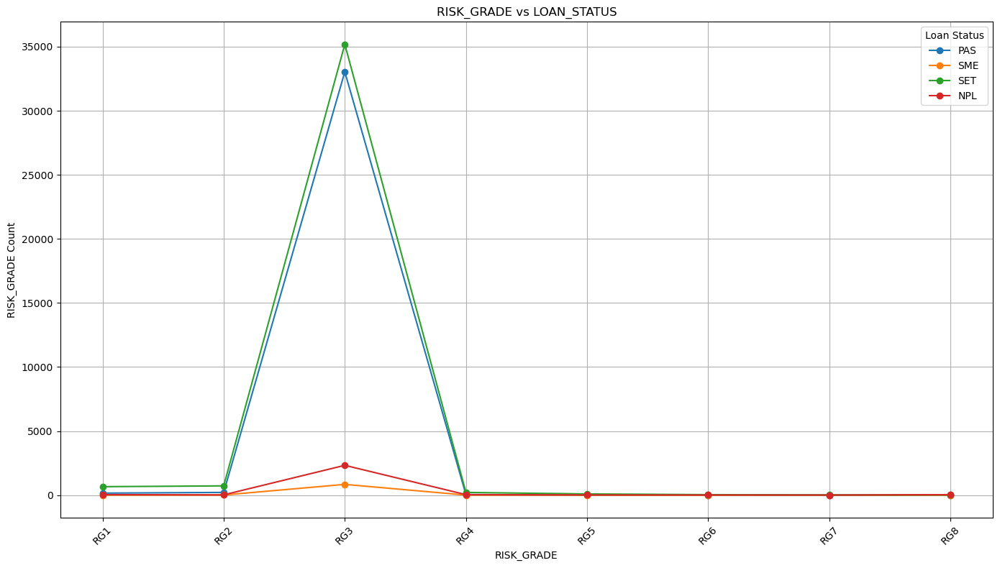

In [32]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='RISK_GRADE', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['RISK_GRADE'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('RISK_GRADE')
ax.set_ylabel('RISK_GRADE Count')
ax.set_title('RISK_GRADE vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## ECONOMIC_SECTOR
- Buliding and constriction have SET and PAS max 
- consumer and staff loan have SET and PAS max

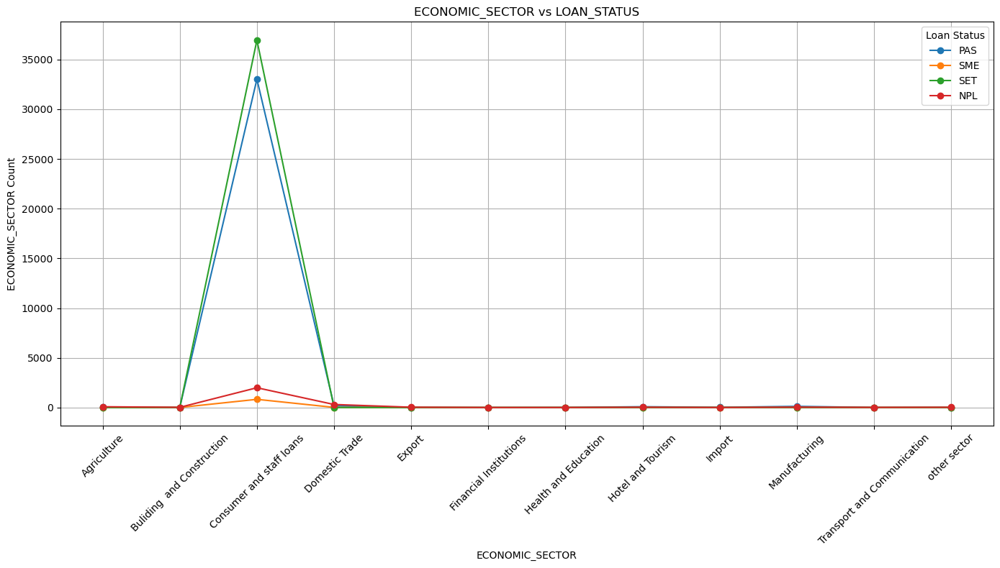

In [33]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='ECONOMIC_SECTOR', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['ECONOMIC_SECTOR'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('ECONOMIC_SECTOR')
ax.set_ylabel('ECONOMIC_SECTOR Count')
ax.set_title('ECONOMIC_SECTOR vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()


## INDUSTRY
-

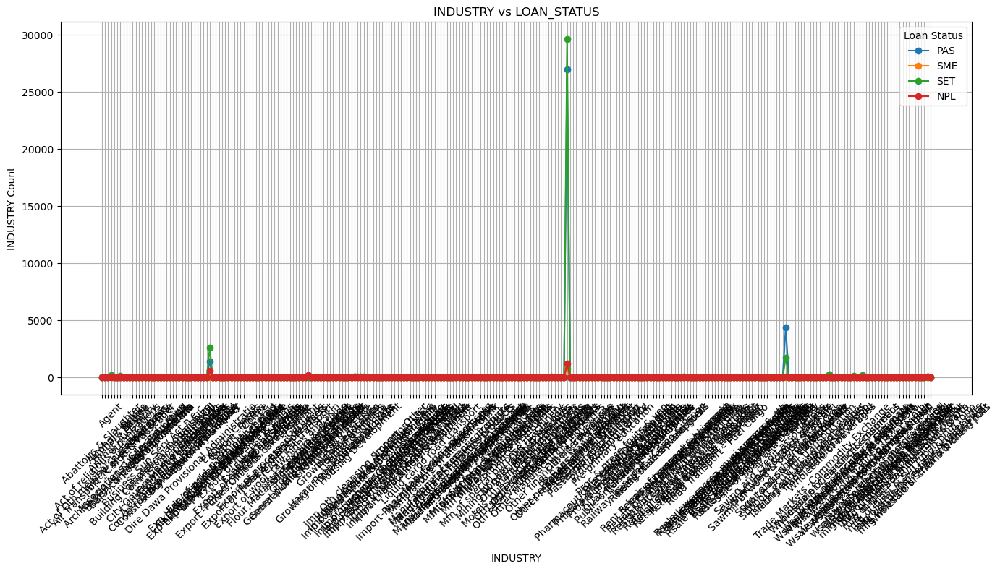

In [34]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='INDUSTRY', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['INDUSTRY'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('INDUSTRY')
ax.set_ylabel('INDUSTRY Count')
ax.set_title('INDUSTRY vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()

## INDUSTRY by Parcnetage 

In [46]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['INDUSTRY', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Display the results
print("Percentage of LOAN_STATUS for each INDUSTRY:\n")
print(loan_status_percentages.to_string(float_format="%.2f"))

Percentage of LOAN_STATUS for each INDUSTRY:

LOAN_STATUS                            NPL    PAS    SET    SME
INDUSTRY                                                       
Abattoirs & Slaughter                 0.00   0.00 100.00   0.00
Act of Oth membership organ n.e.c.    0.00   0.00 100.00   0.00
Act of religious organizations        0.00   0.00 100.00   0.00
Agent                                 1.78  25.62  72.24   0.36
Air Transport , Cargo & Passenger     0.00 100.00   0.00   0.00
Alcoholic Drinks                      0.00   0.00 100.00   0.00
Amhara Region                         0.00   0.00 100.00   0.00
Animal Husbandry                     28.57  14.29  57.14   0.00
Archite eng Act & rel techn consul    0.00 100.00   0.00   0.00
Article of cement & lime              0.00  28.57  71.43   0.00
Associations Under Formation          0.00   0.00 100.00   0.00
Bakery                               28.57   0.00  71.43   0.00
Bakery & pastry - Small scale         0.00 100.00   0.00  

## OWNERSHIP
-  private onwers have highly PAS and SET loan

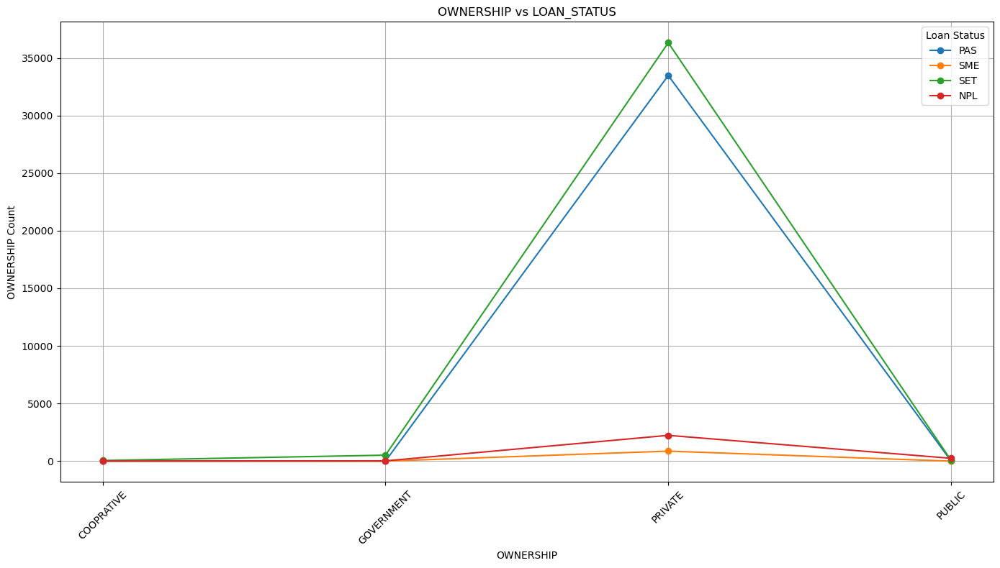

In [35]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='OWNERSHIP', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['OWNERSHIP'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('OWNERSHIP')
ax.set_ylabel('OWNERSHIP Count')
ax.set_title('OWNERSHIP vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()

## SECTOR
- individal sectors have highly SET Loan

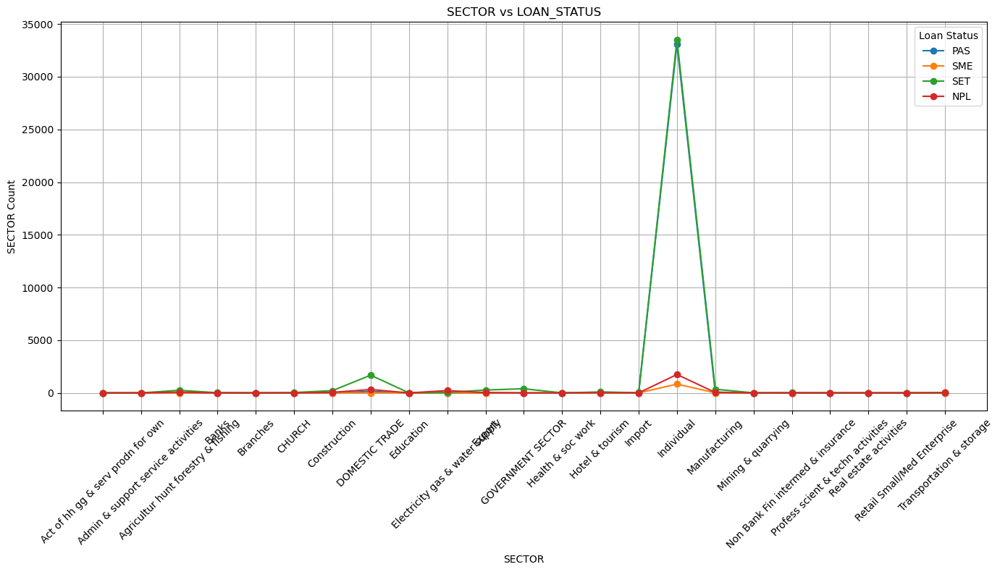

In [36]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='SECTOR', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['SECTOR'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('SECTOR')
ax.set_ylabel('SECTOR Count')
ax.set_title('SECTOR vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()

## Sector By Bar Graph

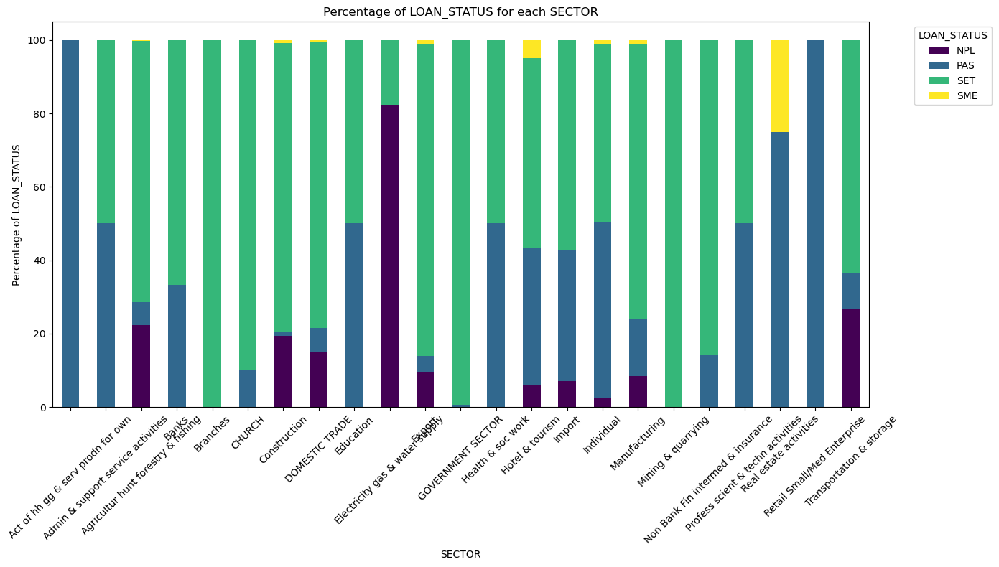

In [41]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['SECTOR', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Plotting the stacked bar plot
loan_status_percentages.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')

plt.xlabel('SECTOR')
plt.ylabel('Percentage of LOAN_STATUS')
plt.title('Percentage of LOAN_STATUS for each SECTOR')
plt.legend(title='LOAN_STATUS', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

## Sector By Parcentage
### 100% PAS Sectors
- Act of hh gg & serv prodn for own
- Retail Small/Med Enterprise
### 80% NPL Sectors
- Electricity gas & water supply
### 100% SET Sectors
- Branches
- Mining & quarrying
### 25 % SME Sectors 
- Real estate activities

In [42]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['SECTOR', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Display the results
print("Percentage of LOAN_STATUS for each SECTOR:\n")
print(loan_status_percentages.to_string(float_format="%.2f"))

Percentage of LOAN_STATUS for each SECTOR:

LOAN_STATUS                          NPL    PAS    SET   SME
SECTOR                                                      
Act of hh gg & serv prodn for own   0.00 100.00   0.00  0.00
Admin & support service activities  0.00  50.00  50.00  0.00
Agricultur hunt forestry & fishing 22.22   6.27  71.23  0.28
Banks                               0.00  33.33  66.67  0.00
Branches                            0.00   0.00 100.00  0.00
CHURCH                              0.00  10.00  90.00  0.00
Construction                       19.41   1.10  78.75  0.73
DOMESTIC TRADE                     14.95   6.66  77.93  0.46
Education                           0.00  50.00  50.00  0.00
Electricity gas & water supply     82.33   0.00  17.67  0.00
Export                              9.63   4.35  84.78  1.24
GOVERNMENT SECTOR                   0.00   0.50  99.50  0.00
Health & soc work                   0.00  50.00  50.00  0.00
Hotel & tourism                     6.02 

## TERM_OF_PAYMENT
- Monthly paid customers are highly PAS and SET Loan

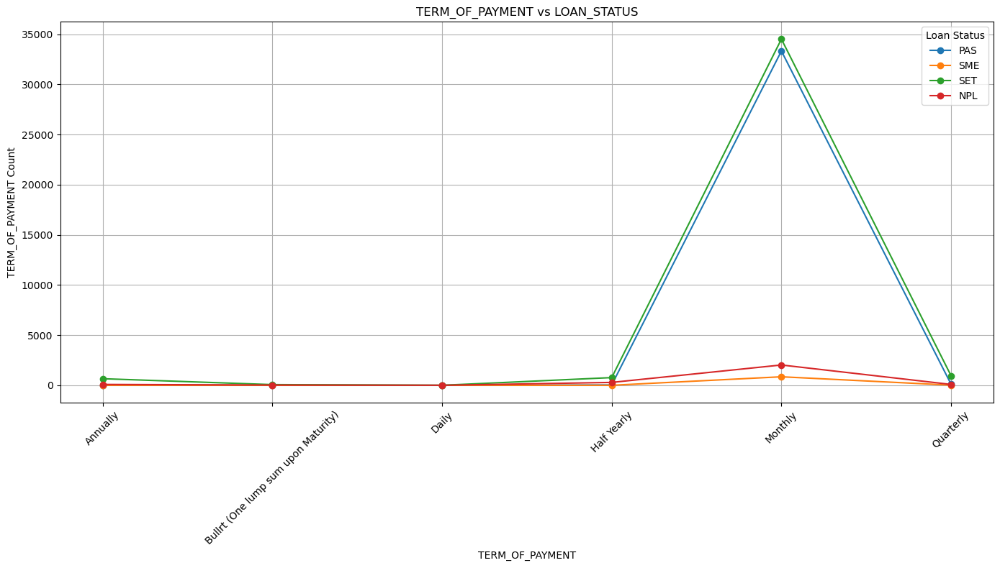

In [37]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='TERM_OF_PAYMENT', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['TERM_OF_PAYMENT'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('TERM_OF_PAYMENT')
ax.set_ylabel('TERM_OF_PAYMENT Count')
ax.set_title('TERM_OF_PAYMENT vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()

## Term_Of_Paymanet by Parcentage

In [43]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['TERM_OF_PAYMENT', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Display the results
print("Percentage of LOAN_STATUS for each TERM_OF_PAYMENT:\n")
print(loan_status_percentages.to_string(float_format="%.2f"))

Percentage of LOAN_STATUS for each TERM_OF_PAYMENT:

LOAN_STATUS                           NPL   PAS   SET  SME
TERM_OF_PAYMENT                                           
Annually                            11.46  1.84 86.69 0.00
Bullrt (One lump sum upon Maturity) 24.30  9.35 65.42 0.93
Daily                               33.33  0.00 66.67 0.00
Half Yearly                         26.34  3.37 70.10 0.18
Monthly                              2.87 47.13 48.80 1.20
Quarterly                            7.54  8.93 82.15 1.39


## PRODUCT_OWNER
- consumer North Addis have max Loan SET
- central Addis Consumer next to Consumer north Addis SET loan
- central Addis Consumer PAS highly loan

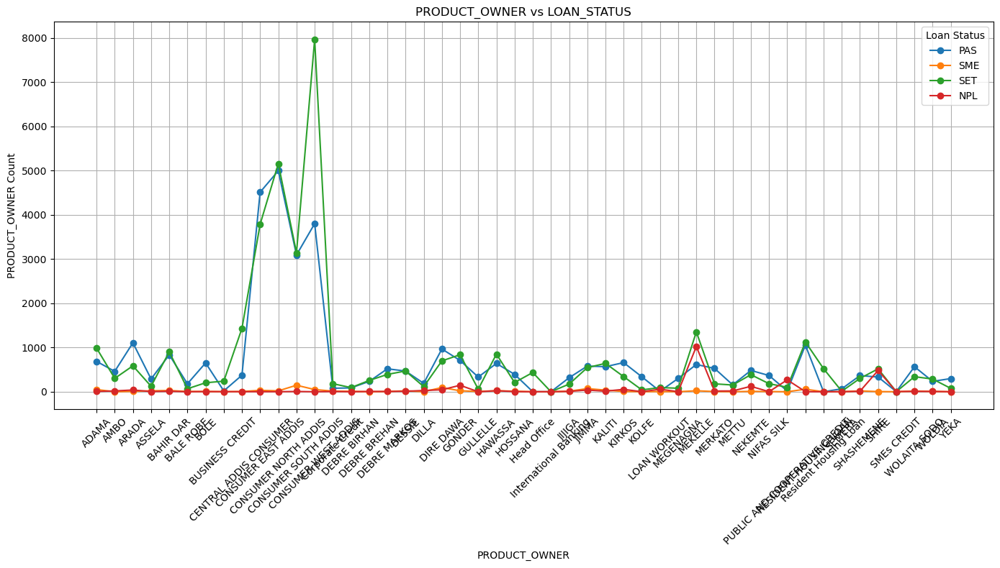

In [38]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='PRODUCT_OWNER', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['PRODUCT_OWNER'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('PRODUCT_OWNER')
ax.set_ylabel('PRODUCT_OWNER Count')
ax.set_title('PRODUCT_OWNER vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()

## PRODUCT_OWNER by Parcnetage 

In [44]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['PRODUCT_OWNER', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Display the results
print("Percentage of LOAN_STATUS for each PRODUCT_OWNER:\n")
print(loan_status_percentages.to_string(float_format="%.2f"))

Percentage of LOAN_STATUS for each PRODUCT_OWNER:

LOAN_STATUS                      NPL   PAS    SET  SME
PRODUCT_OWNER                                         
ADAMA                           0.40 39.67  57.04 2.89
AMBO                            2.43 58.95  38.62 0.00
ARADA                           2.24 63.55  33.64 0.57
ASSELA                          1.14 65.75  28.31 4.79
BAHIR DAR                       0.62 46.99  50.82 1.58
BALE ROBE                       0.39 70.87  26.38 2.36
BOLE                            0.46 75.38  23.47 0.69
BUSINESS CREDIT                 0.76  7.25  91.22 0.76
CENTRAL ADDIS CONSUMER          0.11 20.62  79.00 0.28
CONSUMER EAST ADDIS             0.01 54.15  45.45 0.38
CONSUMER NORTH ADDIS            0.01 49.11  50.68 0.20
CONSUMER SOUTH ADDIS            0.09 48.41  49.19 2.30
CONSUMER WEST ADDIS             0.00 32.16  67.41 0.42
Corporate Credit                2.14 28.11  64.77 4.98
DEBRE BIRHAN                    0.52 45.55  49.21 4.71
DEBRE BREHAN  

## COLLATTERAL
- 

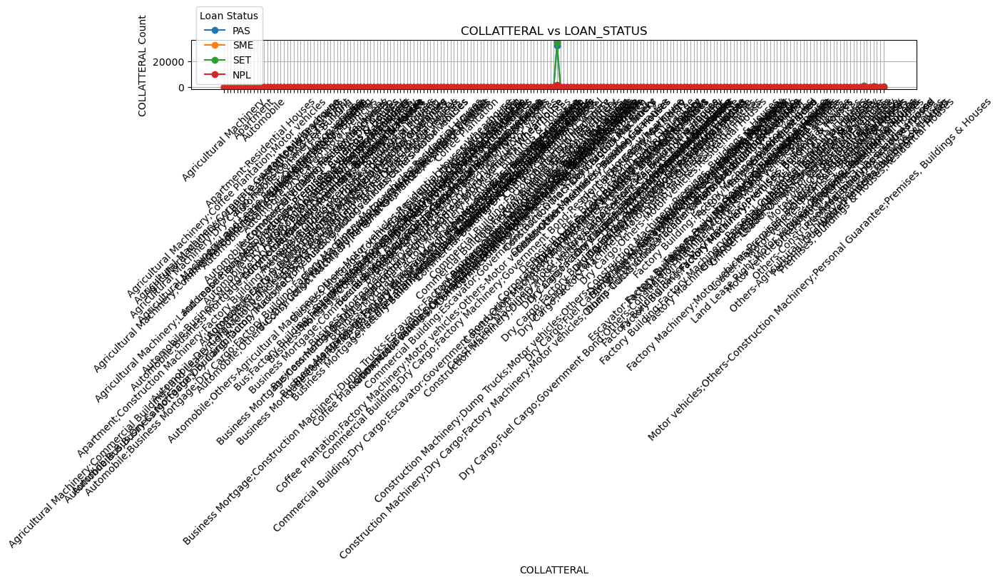

In [39]:
# Pivot the data to get counts of each Loan_Status for each Districtname
pivot_df = df.pivot_table(index='COLLATTERAL', columns='LOAN_STATUS', aggfunc='size', fill_value=0).reset_index()

# Plotting the line graph
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each Loan_Status
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in pivot_df.columns:
        ax.plot(pivot_df['COLLATTERAL'], pivot_df[status], marker='o', linestyle='-', label=status)

ax.set_xlabel('COLLATTERAL')
ax.set_ylabel('COLLATTERAL Count')
ax.set_title('COLLATTERAL vs LOAN_STATUS')
plt.xticks(rotation=45)
ax.legend(title='Loan Status')
ax.grid(True)
plt.tight_layout()

# Enable zoom functionality with mplcursors
# mplcursors.cursor(ax, hover=True)

# Show the plot
plt.show()

## COLLATTERAL by parcnatge 

In [45]:
# Calculate the percentage of each LOAN_STATUS within each SECTOR
loan_status_counts = df.groupby(['COLLATTERAL', 'LOAN_STATUS']).size().unstack(fill_value=0)
loan_status_percentages = loan_status_counts.div(loan_status_counts.sum(axis=1), axis=0) * 100

# Display the results
print("Percentage of LOAN_STATUS for each COLLATTERAL:\n")
print(loan_status_percentages.to_string(float_format="%.2f"))

Percentage of LOAN_STATUS for each COLLATTERAL:

LOAN_STATUS                                                                                                                     NPL    PAS    SET    SME
COLLATTERAL                                                                                                                                             
Agricultural Machinery                                                                                                         0.00   0.00 100.00   0.00
Agricultural Machinery;Coffee Plantation;Motor vehicles                                                                        0.00   0.00 100.00   0.00
Agricultural Machinery;Commercial Building;Land Lease Right;Motor vehicles                                                   100.00   0.00   0.00   0.00
Agricultural Machinery;Commercial Building;Land Lease Right;Motor vehicles;Others-Agricultural Machinery;Residential Houses  100.00   0.00   0.00   0.00
Agricultural Machinery;Corporate 

# Numeric Data analaysis  

### Trands of Loan Status with APPROVED_AMOUNT 
-

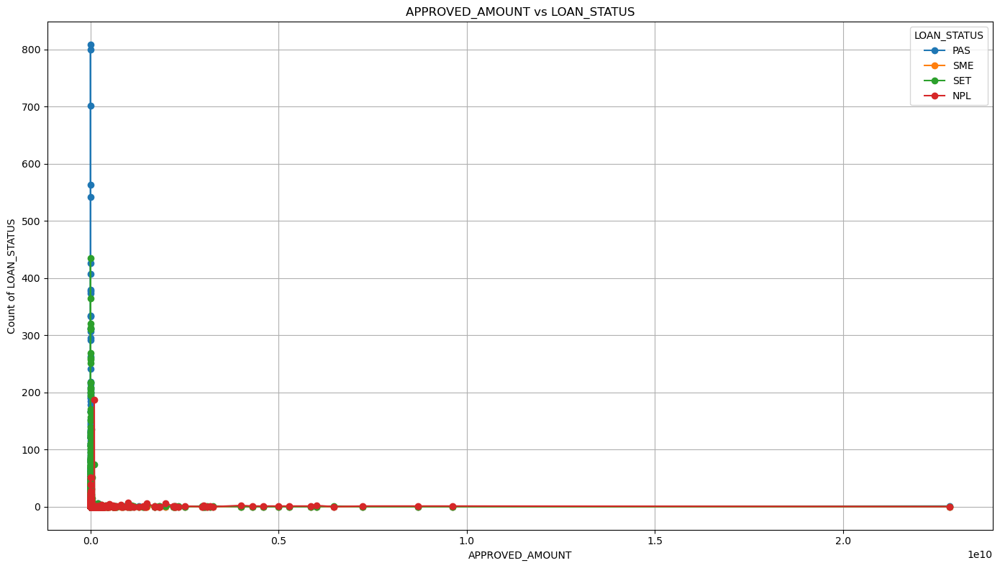

In [50]:
# Group by APPROVED_AMOUNT and LOAN_STATUS and aggregate the data
approved_amount_status = df.groupby(['APPROVED_AMOUNT', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plotting the line graph
plt.figure(figsize=(14, 8))

# Plot each LOAN_STATUS as a line plot
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in approved_amount_status.columns:
        plt.plot(approved_amount_status.index, approved_amount_status[status], marker='o', linestyle='-', label=status)

plt.xlabel('APPROVED_AMOUNT')
plt.ylabel('Count of LOAN_STATUS')
plt.title('APPROVED_AMOUNT vs LOAN_STATUS')
plt.legend(title='LOAN_STATUS')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

### Trands of Loan Status with COLLATERAL_VALUE 
-

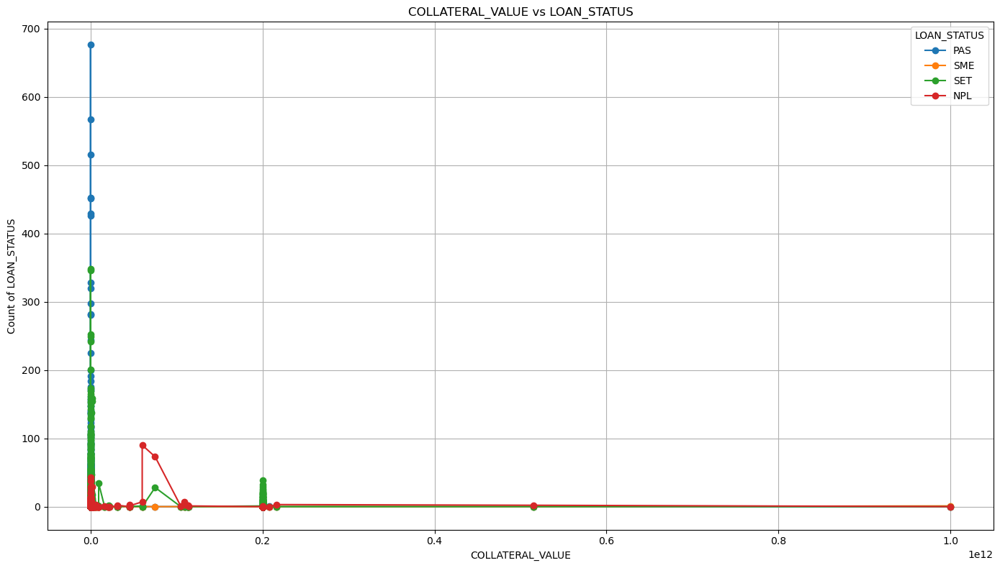

In [51]:
# Group by APPROVED_AMOUNT and LOAN_STATUS and aggregate the data
approved_amount_status = df.groupby(['COLLATERAL_VALUE', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plotting the line graph
plt.figure(figsize=(14, 8))

# Plot each LOAN_STATUS as a line plot
for status in ['PAS', 'SME', 'SET', 'NPL']:
    if status in approved_amount_status.columns:
        plt.plot(approved_amount_status.index, approved_amount_status[status], marker='o', linestyle='-', label=status)

plt.xlabel('COLLATERAL_VALUE')
plt.ylabel('Count of LOAN_STATUS')
plt.title('COLLATERAL_VALUE vs LOAN_STATUS')
plt.legend(title='LOAN_STATUS')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

### trands of Loan_status Refreence Expire_Date with four quarter by bar graph series 

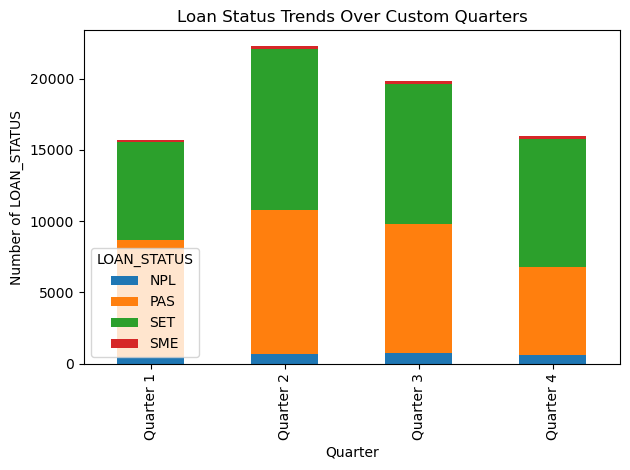

In [31]:
# Convert expiration_date to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Function to assign custom quarters
def assign_quarter(month):
    if month in [ 7, 8, 9]:
        return 'Quarter 1'
    elif month in [10, 11, 12]:
        return 'Quarter 2'
    elif month in [1, 2, 3]:
        return 'Quarter 3'
    elif month in [4, 5, 6]:
        return 'Quarter 4'

# Assign custom quarters
df['quarter'] = df['EXPIRY_DATE'].dt.month.apply(assign_quarter)

# Group by loan status and custom quarter
trends = df.groupby(['quarter', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plot the trends
trends.plot(kind='bar', stacked=True)

# Customize the plot
plt.title('Loan Status Trends Over Custom Quarters')
plt.xlabel('Quarter')
plt.ylabel('Number of LOAN_STATUS')
plt.legend(title='LOAN_STATUS')
plt.tight_layout()

# Show the plot
plt.show()

### trands of Loan_status Refreence Expire_Date with four quarter by bar graph parellel

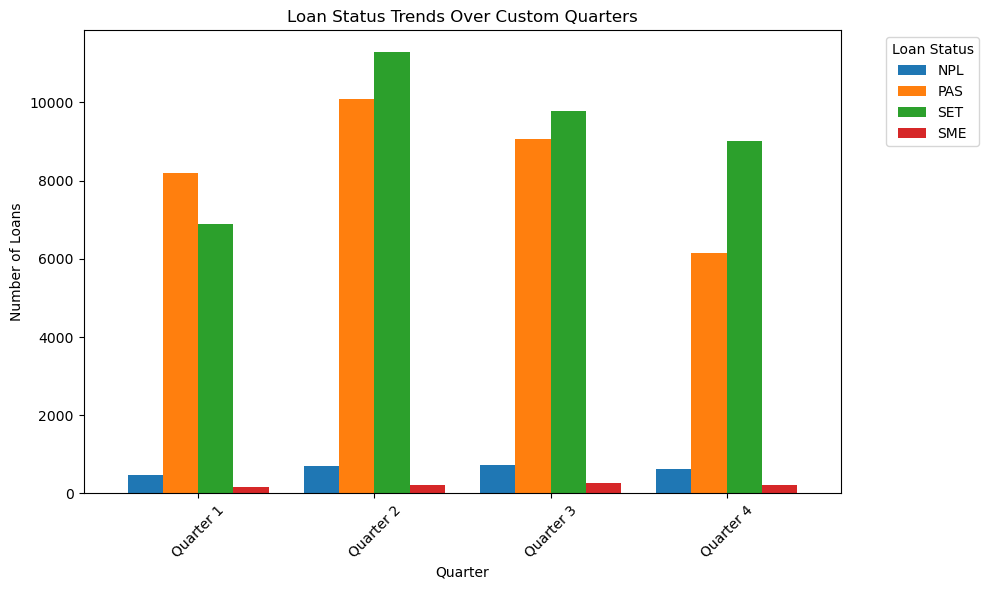

In [33]:
# Convert EXPIRY_DATE to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Function to assign custom quarters
def assign_quarter(month):
    if month in [ 7, 8, 9]:
        return 'Quarter 1'
    elif month in [10, 11, 12]:
        return 'Quarter 2'
    elif month in [1, 2, 3]:
        return 'Quarter 3'
    elif month in [4, 5, 6]:
        return 'Quarter 4'

# Assign custom quarters
df['quarter'] = df['EXPIRY_DATE'].dt.month.apply(assign_quarter)

# Group by loan status and custom quarter
trends = df.groupby(['quarter', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plot the trends
trends.plot(kind='bar', stacked=False, figsize=(10, 6), width=0.8)

# Customize the plot
plt.title('Loan Status Trends Over Custom Quarters')
plt.xlabel('Quarter')
plt.ylabel('Number of Loans')
plt.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

## Trands of loan_status with quarters by line graph

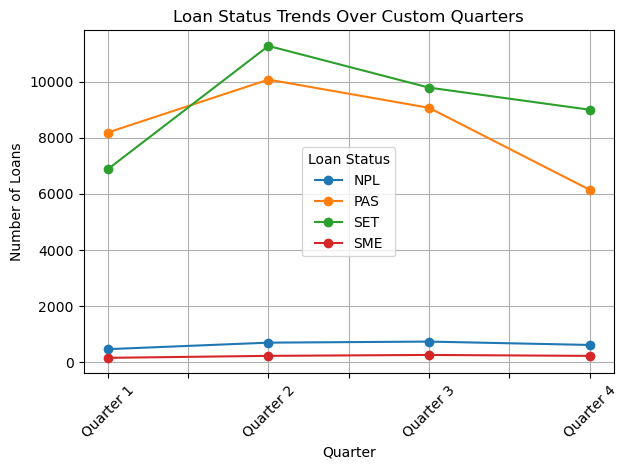

In [34]:
# Convert expiration_date to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Function to assign custom quarters
def assign_quarter(month):
    if month in [ 7, 8, 9]:
        return 'Quarter 1'
    elif month in [10, 11, 12]:
        return 'Quarter 2'
    elif month in [1, 2, 3]:
        return 'Quarter 3'
    elif month in [4, 5, 6]:
        return 'Quarter 4'

# Assign custom quarters
df['quarter'] = df['EXPIRY_DATE'].dt.month.apply(assign_quarter)

# Group by loan status and custom quarter
trends = df.groupby(['quarter', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plot the trends with a line graph
trends.plot(kind='line', marker='o')

# Customize the plot
plt.title('Loan Status Trends Over Custom Quarters')
plt.xlabel('Quarter')
plt.ylabel('Number of Loans')
plt.legend(title='Loan Status')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

## Identify which quarter is more customer needs credit  from granted date 

- bank prepare more many for credit
- why these is happen
- to know the customers need

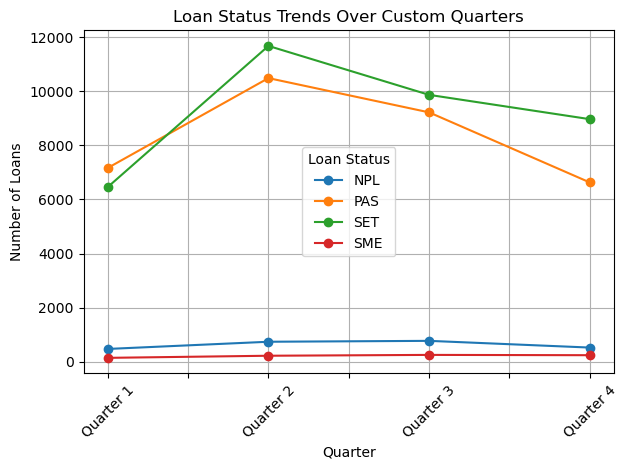

In [35]:
# Convert expiration_date to datetime
df['GRANT_DATE'] = pd.to_datetime(df['GRANT_DATE'])

# Function to assign custom quarters
def assign_quarter(month):
    if month in [ 7, 8, 9]:
        return 'Quarter 1'
    elif month in [10, 11, 12]:
        return 'Quarter 2'
    elif month in [1, 2, 3]:
        return 'Quarter 3'
    elif month in [4, 5, 6]:
        return 'Quarter 4'

# Assign custom quarters
df['quarter'] = df['GRANT_DATE'].dt.month.apply(assign_quarter)

# Group by loan status and custom quarter
trends = df.groupby(['quarter', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plot the trends with a line graph
trends.plot(kind='line', marker='o')

# Customize the plot
plt.title('Loan Status Trends Over Custom Quarters')
plt.xlabel('Quarter')
plt.ylabel('Number of Loans')
plt.legend(title='Loan Status')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

## Trands loan_status over all Dataset
- strating from data collect in CBE
- goes up to the future exprire date of the loan
- refence is expere date 

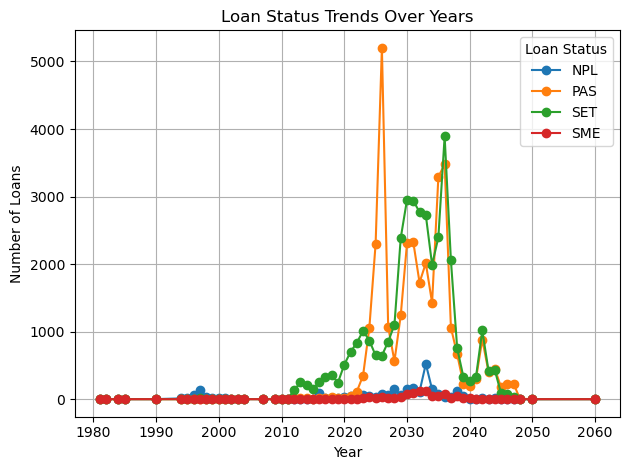

In [36]:
# Convert expiration_date to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year from expiration_date
df['year'] = df['EXPIRY_DATE'].dt.year

# Group by loan status and year
trends = df.groupby(['year', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plot the trends with a line graph
trends.plot(kind='line', marker='o')

# Customize the plot
plt.title('Loan Status Trends Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Loans')
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

## Trands of loan_staus between 2014 -2024 since T24 started in CBE
- since T24 started up to know
- whe seen the changes even in data managemnet 
- maximum loan stelled since 2023
- maximum loan pass since 2024
- NPL remains constant whiel increase 

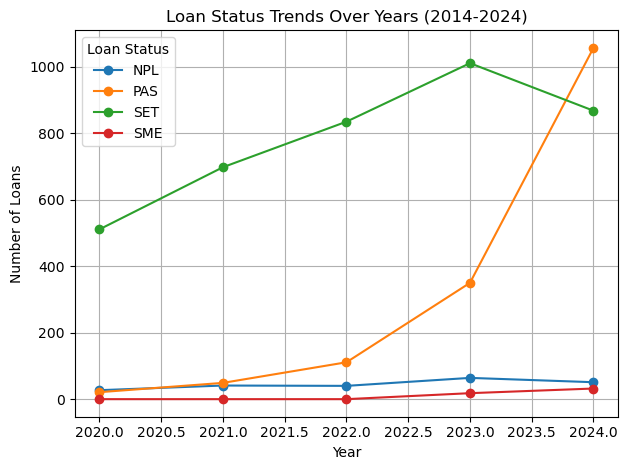

In [37]:
# Filter the dataset to include only records between 2014 and 2024
df = df[(df['EXPIRY_DATE'] >= '2014-01-01') & (df['EXPIRY_DATE'] <= '2024-12-31')]

# Convert expiration_date to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year from expiration_date
df['year'] = df['EXPIRY_DATE'].dt.year

# Group by loan status and year
trends = df.groupby(['year', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plot the trends with a line graph
trends.plot(kind='line', marker='o')

# Customize the plot
plt.title('Loan Status Trends Over Years (2014-2024)')
plt.xlabel('Year')
plt.ylabel('Number of Loans')
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

## The parcantages of loan over time by year
- stalled loan over time is decreasing 
- since CBE do not provide shor term loan
- pass remains increase 
- NPL and SME is reamins constant 

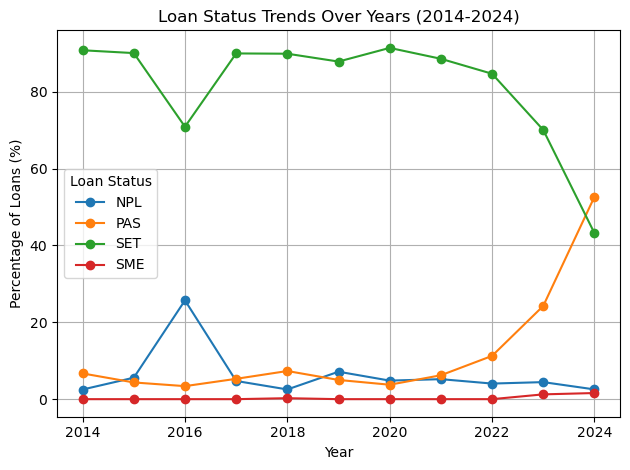

In [42]:
# Filter the dataset to include only records between 2014 and 2024
df = df[(df['EXPIRY_DATE'] >= '2014-01-01') & (df['EXPIRY_DATE'] <= '2024-12-31')]

# Convert EXPIRY_DATE to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year from EXPIRY_DATE
df['year'] = df['EXPIRY_DATE'].dt.year

# Group by loan status and year
status_year_counts = df.groupby(['year', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Calculate the percentage of each loan status in each year
status_year_percentage = status_year_counts.div(status_year_counts.sum(axis=1), axis=0) * 100

# Plot the trends with a line graph
status_year_percentage.plot(kind='line', marker='o')

# Customize the plot
plt.title('Loan Status Trends Over Years (2014-2024)')
plt.xlabel('Year')
plt.ylabel('Percentage of Loans (%)')
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

## Each years parcentage of Loan Status 

In [43]:
# Filter the dataset to include only records between 2014 and 2024
df = df[(df['EXPIRY_DATE'] >= '2014-01-01') & (df['EXPIRY_DATE'] <= '2024-12-31')]

# Convert EXPIRY_DATE to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year from EXPIRY_DATE
df['year'] = df['EXPIRY_DATE'].dt.year

# Group by loan status and year
status_year_counts = df.groupby(['year', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Calculate the percentage of each loan status in each year
status_year_percentage = status_year_counts.div(status_year_counts.sum(axis=1), axis=0) * 100

# Display the percentage table
print(status_year_percentage)

LOAN_STATUS        NPL        PAS        SET       SME
year                                                  
2014          2.510460   6.694561  90.794979  0.000000
2015          5.590062   4.347826  90.062112  0.000000
2016         25.706215   3.389831  70.903955  0.000000
2017          4.735376   5.292479  89.972145  0.000000
2018          2.525253   7.323232  89.898990  0.252525
2019          7.142857   5.000000  87.857143  0.000000
2020          4.830054   3.756708  91.413238  0.000000
2021          5.203046   6.218274  88.578680  0.000000
2022          4.056795  11.257606  84.685598  0.000000
2023          4.435204  24.255024  70.062370  1.247401
2024          2.539841  52.639442  43.227092  1.593625


### Show over all summary of loan status since 2014-2024

In [44]:
# Filter the dataset to include only records between 2014 and 2024
df = df[(df['EXPIRY_DATE'] >= '2014-01-01') & (df['EXPIRY_DATE'] <= '2024-12-31')]

# Convert EXPIRY_DATE to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year from EXPIRY_DATE
df['year'] = df['EXPIRY_DATE'].dt.year

# Group by loan status and year
status_year_counts = df.groupby(['year', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Calculate the percentage of each loan status in each year
status_year_percentage = status_year_counts.div(status_year_counts.sum(axis=1), axis=0) * 100

# Display the percentage table
print("Percentage table for each year:")
print(status_year_percentage)

# Calculate overall summary percentage for each loan status class across all years
overall_summary = status_year_counts.sum(axis=0)
overall_percentage = overall_summary / overall_summary.sum() * 100

# Display the overall summary
print("\nOverall summary percentage of each loan status class from 2014 to 2024:")
print(overall_percentage)

Percentage table for each year:
LOAN_STATUS        NPL        PAS        SET       SME
year                                                  
2014          2.510460   6.694561  90.794979  0.000000
2015          5.590062   4.347826  90.062112  0.000000
2016         25.706215   3.389831  70.903955  0.000000
2017          4.735376   5.292479  89.972145  0.000000
2018          2.525253   7.323232  89.898990  0.252525
2019          7.142857   5.000000  87.857143  0.000000
2020          4.830054   3.756708  91.413238  0.000000
2021          5.203046   6.218274  88.578680  0.000000
2022          4.056795  11.257606  84.685598  0.000000
2023          4.435204  24.255024  70.062370  1.247401
2024          2.539841  52.639442  43.227092  1.593625

Overall summary percentage of each loan status class from 2014 to 2024:
LOAN_STATUS
NPL     4.965007
PAS    22.250099
SET    72.111449
SME     0.673445
dtype: float64


# Extracting month from Expire_date and know the trand of each month loan status
- which month was more loans are expire date
- which month loan are collected more 
- over year which month is more loan collected 


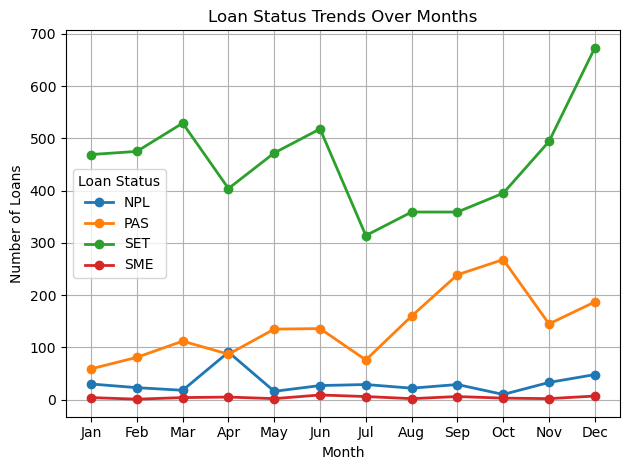

In [41]:
# Assuming df is already defined and 'EXPIRY_DATE' is converted to datetime
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the month from EXPIRY_DATE
df['month'] = df['EXPIRY_DATE'].dt.month

# Group by loan status and month
trends = df.groupby(['month', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Plot the trends with a line graph
ax = trends.plot(kind='line', marker='o', linestyle='-', linewidth=2)

# Customize the plot
plt.title('Loan Status Trends Over Months')
plt.xlabel('Month')
plt.ylabel('Number of Loans')
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()

# Optionally, you could set x-ticks to show month names for better clarity
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
plt.show()

Percentage table for each month:
LOAN_STATUS       NPL        PAS        SET       SME
year_month                                           
2014-01      8.333333   0.000000  91.666667  0.000000
2014-02      5.000000   5.000000  90.000000  0.000000
2014-03      0.000000   6.250000  93.750000  0.000000
2014-04      9.090909   0.000000  90.909091  0.000000
2014-05      6.666667  26.666667  66.666667  0.000000
...               ...        ...        ...       ...
2024-08      2.145923  48.068670  48.927039  0.858369
2024-09      1.167315  66.147860  31.517510  1.167315
2024-10      0.809717  60.728745  37.246964  1.214575
2024-11      2.380952  59.523810  36.507937  1.587302
2024-12      3.381643  52.657005  42.028986  1.932367

[132 rows x 4 columns]

Overall summary percentage of each loan status class from 2014 to 2024:
LOAN_STATUS
NPL     4.965007
PAS    22.250099
SET    72.111449
SME     0.673445
dtype: float64


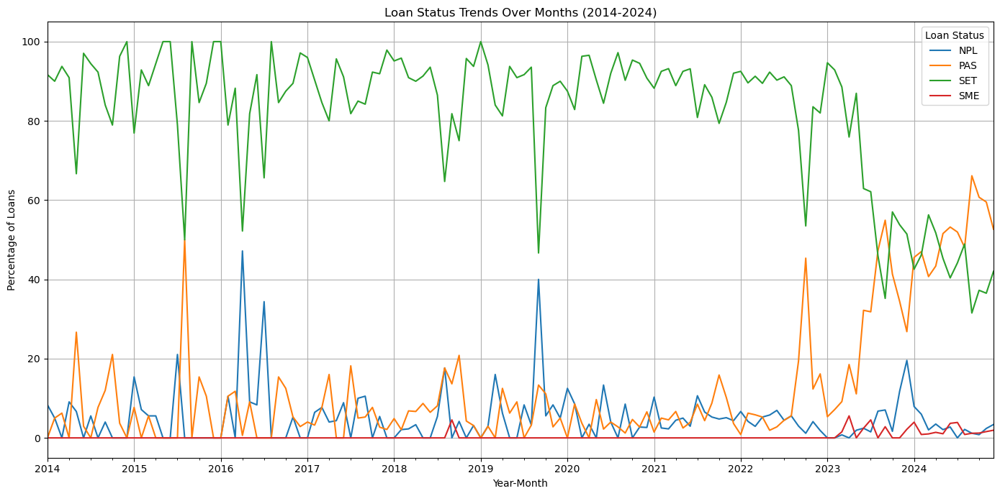

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the dataset to include only records between 2014 and 2024
df = df[(df['EXPIRY_DATE'] >= '2014-01-01') & (df['EXPIRY_DATE'] <= '2024-12-31')]

# Convert EXPIRY_DATE to datetime (this step can be skipped if already done)
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year and month from EXPIRY_DATE
df['year_month'] = df['EXPIRY_DATE'].dt.to_period('M')

# Group by loan status and year-month
status_month_counts = df.groupby(['year_month', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Calculate the percentage of each loan status in each month
status_month_percentage = status_month_counts.div(status_month_counts.sum(axis=1), axis=0) * 100

# Display the percentage table
print("Percentage table for each month:")
print(status_month_percentage)

# Calculate overall summary percentage for each loan status class across all months
overall_summary = status_month_counts.sum(axis=0)
overall_percentage = overall_summary / overall_summary.sum() * 100

# Display the overall summary
print("\nOverall summary percentage of each loan status class from 2014 to 2024:")
print(overall_percentage)

# Plot the trends with a line graph without markers
status_month_percentage.plot(kind='line', figsize=(14, 7))

# Customize the plot
plt.title('Loan Status Trends Over Months (2014-2024)')
plt.xlabel('Year-Month')
plt.ylabel('Percentage of Loans')
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


# Extract week from Exprie_date

Percentage table for each week:
LOAN_STATUS            NPL        PAS         SET       SME
year month week                                            
2014 1     1      0.000000   0.000000  100.000000  0.000000
           2      0.000000   0.000000  100.000000  0.000000
           3      0.000000   0.000000  100.000000  0.000000
           4      0.000000   0.000000  100.000000  0.000000
           5     50.000000   0.000000   50.000000  0.000000
...                    ...        ...         ...       ...
2024 12    48     0.000000  50.000000   50.000000  0.000000
           49     7.894737  50.000000   39.473684  2.631579
           50     0.000000  50.000000   50.000000  0.000000
           51     2.173913  58.695652   36.956522  2.173913
           52     5.263158  50.877193   40.350877  3.508772

[641 rows x 4 columns]


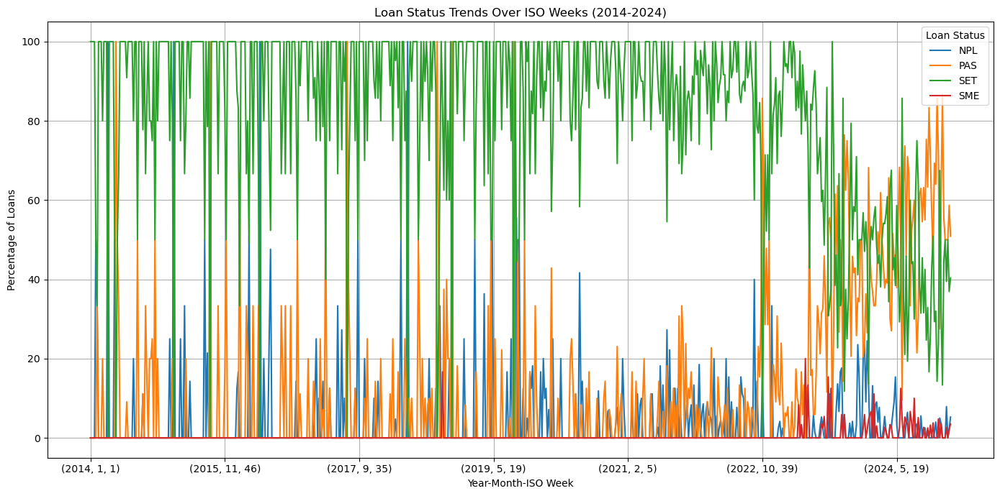

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with 'EXPIRY_DATE' and 'LOAN_STATUS' columns

# Filter the dataset to include only records between 2014 and 2024
df = df[(df['EXPIRY_DATE'] >= '2014-01-01') & (df['EXPIRY_DATE'] <= '2024-12-31')]

# Convert EXPIRY_DATE to datetime (this step can be skipped if already done)
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year, month, and ISO week from EXPIRY_DATE
df['year'] = df['EXPIRY_DATE'].dt.year
df['month'] = df['EXPIRY_DATE'].dt.month
df['week'] = df['EXPIRY_DATE'].dt.isocalendar().week

# Group by loan status, year, month, and ISO week
status_week_counts = df.groupby(['year', 'month', 'week', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Calculate the percentage of each loan status in each week
status_week_percentage = status_week_counts.div(status_week_counts.sum(axis=1), axis=0) * 100

# Display the percentage table (optional)
print("Percentage table for each week:")
print(status_week_percentage)

# Plot the trends with a line graph without markers
status_week_percentage.plot(kind='line', figsize=(14, 7))

# Customize the plot
plt.title('Loan Status Trends Over ISO Weeks (2014-2024)')
plt.xlabel('Year-Month-ISO Week')
plt.ylabel('Percentage of Loans')
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


# Extract day from exprie_date

Percentage table for each day:
LOAN_STATUS           NPL         PAS         SET  SME
year month day                                        
2014 1     2     0.000000    0.000000  100.000000  0.0
           11    0.000000    0.000000  100.000000  0.0
           12    0.000000    0.000000  100.000000  0.0
           15    0.000000    0.000000  100.000000  0.0
           17    0.000000    0.000000  100.000000  0.0
...                   ...         ...         ...  ...
2024 12    27   18.181818   27.272727   54.545455  0.0
           28    0.000000   60.000000   40.000000  0.0
           29    0.000000   45.454545   54.545455  0.0
           30    0.000000   46.666667   53.333333  0.0
           31    0.000000  100.000000    0.000000  0.0

[2494 rows x 4 columns]


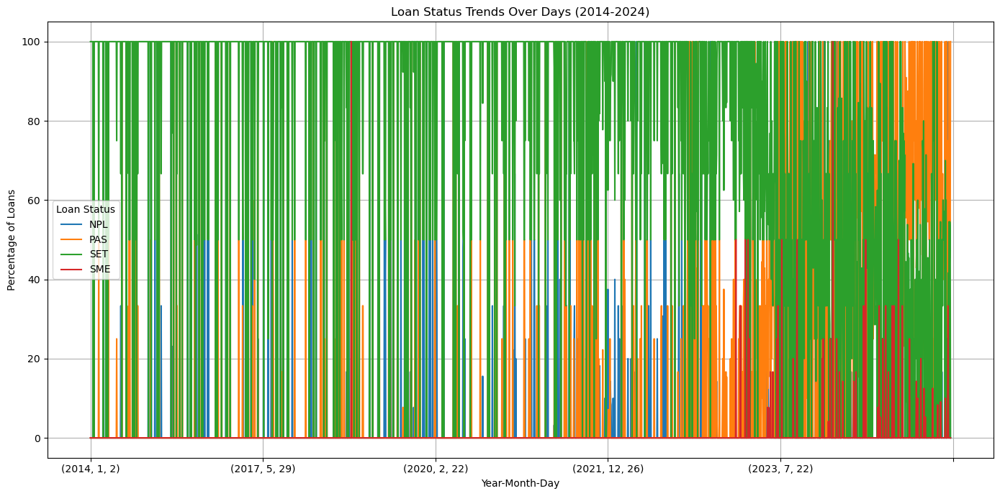

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with 'EXPIRY_DATE' and 'LOAN_STATUS' columns

# Filter the dataset to include only records between 2014 and 2024
df = df[(df['EXPIRY_DATE'] >= '2014-01-01') & (df['EXPIRY_DATE'] <= '2024-12-31')]

# Convert EXPIRY_DATE to datetime (this step can be skipped if already done)
df['EXPIRY_DATE'] = pd.to_datetime(df['EXPIRY_DATE'])

# Extract the year, month, and day from EXPIRY_DATE
df['year'] = df['EXPIRY_DATE'].dt.year
df['month'] = df['EXPIRY_DATE'].dt.month
df['day'] = df['EXPIRY_DATE'].dt.day

# Group by loan status, year, month, and day
status_day_counts = df.groupby(['year', 'month', 'day', 'LOAN_STATUS']).size().unstack(fill_value=0)

# Calculate the percentage of each loan status in each day
status_day_percentage = status_day_counts.div(status_day_counts.sum(axis=1), axis=0) * 100

# Display the percentage table (optional)
print("Percentage table for each day:")
print(status_day_percentage)

# Plot the trends with a line graph without markers
status_day_percentage.plot(kind='line', figsize=(14, 7))

# Customize the plot
plt.title('Loan Status Trends Over Days (2014-2024)')
plt.xlabel('Year-Month-Day')
plt.ylabel('Percentage of Loans')
plt.legend(title='Loan Status')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


## Save_cleaned_data_2014-2024

In [48]:
df.drop(['CONTRACT_CODE'],axis=1, inplace=True)
# df.drop(['NBE_LOAN_STATUS'],axis=1, inplace=True)
# df.drop(['year'],axis=1, inplace=True)
# df.drop(['quarter'],axis=1, inplace=True)
df.drop(['GRANT_DATE'],axis=1, inplace=True)
df.drop(['EXPIRY_DATE'],axis=1, inplace=True)
df.drop(['BUSINESS_DATE'],axis=1, inplace=True)

In [49]:
# Save the cleaned DataFrame back to an Excel file
df.to_excel('D:/CBE_project_related/LOAN WITH COLLATERAL/cleaned_data_2014-2024.xlsx', index=False)

### Save Cleaned Dataset  for EDA dynamic and model devlopment and deployment (Whole Data)

In [37]:
# Save the cleaned DataFrame back to an Excel file
df.to_excel('D:/CBE_project_related/LOAN WITH COLLATERAL/cleaned_data_EDA.xlsx', index=False)

# ***Phase II***

# Model Development  Using the following algorithms  
- Random forest, 
- XGBoost, 
- LightBoost, 
- CatBoost 
- LSTM
- MLPNN
## Model Evalution
- Accuracy 
- presion
- Recall
- F1-score
- ROC
### Model Expalnantion using Exaplanable AI such as:
- SHAP (SHapley Additive exPlanations) and
- LIME (Local Interpretable Model-agnostic Explanations)

In [2]:
import pandas as pd
df = pd.read_excel('D:/CBE_project_related/LOAN WITH COLLATERAL/cleaned_data_2014-2024.xlsx')
df

,DISTRICTNAME,REGIONNAME,CBE_REGION,BRANCHNAME,APPROVED_AMOUNT,TENURE,TERM,LOAN_TYPE,LOAN_DESCRIPTION,LOAN_PRODUCT,...,TERM_OF_PAYMENT,PRODUCT_OWNER,COLLATTERAL,COLLATERAL_VALUE,quarter,year,month,year_month,day,week
0,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,5.000000e+06,Short Term,SHORT TERM,OD,Current Account with Overdraft,OD,...,Monthly,BUSINESS CREDIT,Automobile;Dry Cargo;Residential Houses,4.148046e+07,Quarter 2,2023,11,2023-11,8,45
1,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,1.000000e+08,Short Term,SHORT TERM,OD,Current Account with Overdraft,OD,...,Monthly,Corporate Credit,Factory Building,1.000000e+08,Quarter 4,2024,4,2024-04,27,17
2,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,1.380000e+07,Short Term,SHORT TERM,OD,Current Account with Overdraft,OD,...,Monthly,LOAN WORKOUT,"Premises, Buildings & Houses",1.275533e+07,Quarter 4,2024,4,2024-04,11,15
3,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,2.000000e+08,Short Term,SHORT TERM,OD,Current Account with Overdraft,OD,...,Monthly,Corporate Credit,Commercial Building;Dry Cargo;Escavator;Govern...,5.691644e+08,Quarter 2,2024,11,2024-11,15,46
4,ARADA,ADDIS ABABA,CENTRAL,Addis Ababa Branch,3.000000e+07,Short Term,SHORT TERM,OD,Current Account with Overdraft,OD,...,Monthly,LOAN WORKOUT,Dry Cargo;Factory Building;Factory Machinery;O...,8.000880e+07,Quarter 3,2024,1,2024-01,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7568,WOLAITA SODO,South Ethiopia,SOUTH WEST,Yelasawla Branch,2.625000e+05,Long Term,LONG TERM,TL,Condominium Loan,CONDO.COMM,...,Monthly,WOLAITA SODO,Condominium,3.231385e+05,Quarter 4,2023,6,2023-06,3,22
7569,GONDER,TIGRAY,NORTH EAST,Humera Branch,3.000000e+06,Long Term,SHORT TERM,TL,Working Capital & Project Loan,TERM.LOAN,...,Annually,GONDER,Condominium,6.101246e+06,Quarter 1,2020,6,2020-06,30,27
7570,Head Office,ADDIS ABABA,CENTRAL,West Addis Cons Loan,7.106720e+05,Long Term,MEDIUM,TL,Condominium Loan,CONDO.COMM,...,Monthly,Head Office,Condominium,4.656259e+05,Quarter 4,2023,5,2023-05,21,20
7571,KIRKOS,ADDIS ABABA,CENTRAL,Minasie Lema Branch,1.882920e+05,Medium Term,SHORT TERM,OD,Employee Salary Advance,OD,...,Monthly,KIRKOS,Condominium,2.540207e+05,Quarter 3,2024,2,2024-02,11,6


In [3]:
df.columns

Index(['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME',
       'APPROVED_AMOUNT', 'TENURE', 'TERM', 'LOAN_TYPE', 'LOAN_DESCRIPTION',
       'LOAN_PRODUCT', 'LTYPE', 'CUST_SHORTNAME', 'DAO_NAME', 'PRINCIPAL_OS',
       'INTEREST_OS', 'LOAN_STATUS', 'NBE_LOAN_STATUS', 'PRINCIPAL_ARREARS',
       'INTEREST_ARREARS', 'CURRENT_COMMITTMENT', 'INSTALLMENT_AMOUNT',
       'INSTALLMENT_FREQ_PRINCIPAL', 'INSTALLMENT_FREQ_INTEREST', 'RISK_GRADE',
       'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT',
       'PRODUCT_OWNER', 'COLLATTERAL', 'COLLATERAL_VALUE', 'quarter', 'year',
       'month', 'year_month', 'day', 'week'],
      dtype='object')

In [4]:
# df.drop(['CONTRACT_CODE'],axis=1, inplace=True)
df.drop(['NBE_LOAN_STATUS'],axis=1, inplace=True)
df.drop(['year'],axis=1, inplace=True)
df.drop(['quarter'],axis=1, inplace=True)

df.drop(['month'],axis=1, inplace=True)
df.drop(['year_month'],axis=1, inplace=True)
df.drop(['day'],axis=1, inplace=True)
df.drop(['week'],axis=1, inplace=True)
# df.drop(['GRANT_DATE'],axis=1, inplace=True)
# df.drop(['EXPIRY_DATE'],axis=1, inplace=True)
# df.drop(['BUSINESS_DATE'],axis=1, inplace=True)

In [5]:
# Save the cleaned DataFrame back to an Excel file
#df.to_excel('D:/CBE_project_Title/LOAN WITH COLLATERAL/cleaned_data_2014-2024.xlsx', index=False)

In [6]:
# Updating PRODUCT_OWNER to 'Head Office' for specific conditions
df.loc[df.PRODUCT_OWNER == 'CONSUMER WEST ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CONSUMER NORTH ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CONSUMER EAST ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CENTRAL ADDIS CONSUMER', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'CONSUMER SOUTH ADDIS', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'Resident Housing Loan', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'RESIDENT HOUSING LOAN', 'PRODUCT_OWNER'] = 'Head Office'
df.loc[df.PRODUCT_OWNER == 'International Banking', 'PRODUCT_OWNER'] = 'Head Office'

# Correcting inconsistent PRODUCT_OWNER values
df.loc[df.PRODUCT_OWNER == 'DEBRE BIRHAN', 'PRODUCT_OWNER'] = 'DEBRE BREHAN'


In [7]:
# Updating DISTRICTNAME to 'Head Office' for specific conditions
df.loc[df.DISTRICTNAME == 'CONSUMER WEST ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CONSUMER NORTH ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CONSUMER EAST ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CENTRAL ADDIS CONSUMER', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'CONSUMER SOUTH ADDIS', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'Resident Housing Loan', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'RESIDENT HOUSING LOAN', 'DISTRICTNAME'] = 'Head Office'
df.loc[df.DISTRICTNAME == 'International Banking', 'DISTRICTNAME'] = 'Head Office'

# Correcting inconsistent PRODUCT_OWNER values
# df.loc[df.PRODUCT_OWNER == 'DEBRE BIRHAN', 'PRODUCT_OWNER'] = 'DEBRE BREHAN'

# Random forest 

Accuracy: 0.974917491749175
Precision: 0.9698253779388132
Recall: 0.974917491749175
F1 Score: 0.9720519309722434
ROC AUC: 0.9730251976514475


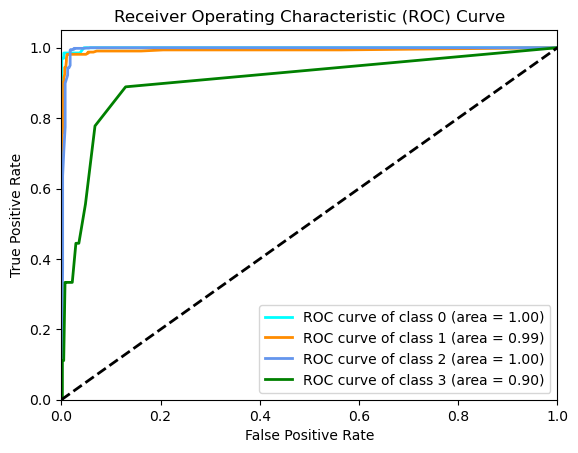

In [42]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('LOAN_STATUS', axis=1)  # Replace 'LOAN_STATUS' with the name of your target column
    y = df['LOAN_STATUS']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Assuming df is already loaded
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Evaluate model
y_pred = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class='ovr')

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = len(np.unique(y))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, rf_model.predict_proba(X_test)[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


# XGBoost 

Accuracy: 0.9815181518151815
Precision: 0.9771479577545591
Recall: 0.9815181518151815
F1 Score: 0.9792324522136909
ROC AUC: 0.9896336800634247


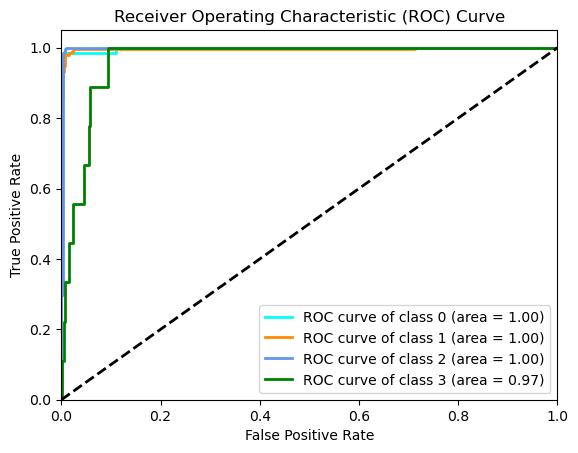

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from xgboost import XGBClassifier
import matplotlib.pyplot as plt

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('LOAN_STATUS', axis=1)  # Replace 'LOAN_STATUS' with the name of your target column
    y = df['LOAN_STATUS']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

# Preprocess data
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# Evaluate model
y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, xgb_model.predict_proba(X_test), multi_class='ovr')

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = len(np.unique(y))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, xgb_model.predict_proba(X_test)[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


# lightgbm 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2847
[LightGBM] [Info] Number of data points in the train set: 6058, number of used features: 279
[LightGBM] [Info] Start training from score -2.975794
[LightGBM] [Info] Start training from score -1.490958
[LightGBM] [Info] Start training from score -0.332814
[LightGBM] [Info] Start training from score -4.971465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Accuracy: 0.9841584158415841
Precision: 0.979871658489616
Recall: 0.9841584158415841
F1 Score: 0.9819265827110932
ROC AUC: 0.9796354451615263


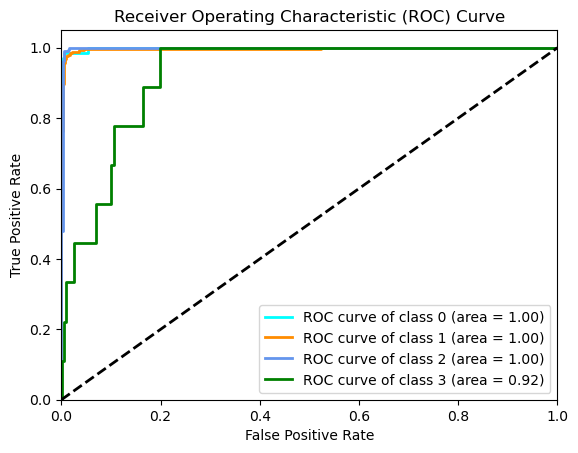

In [44]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
import lightgbm as lgb
import matplotlib.pyplot as plt

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('LOAN_STATUS', axis=1)  # Replace 'LOAN_STATUS' with the name of your target column
    y = df['LOAN_STATUS']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

# Preprocess data
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train LightGBM model
lgb_model = lgb.LGBMClassifier(random_state=42)
lgb_model.fit(X_train, y_train)

# Evaluate model
y_pred = lgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, lgb_model.predict_proba(X_test), multi_class='ovr')

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = len(np.unique(y))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, lgb_model.predict_proba(X_test)[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()



# Catboost


C:\Users\Daveee\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Accuracy: 0.968976897689769
Precision: 0.9639212166254464
Recall: 0.968976897689769
F1 Score: 0.9657277975239807
ROC AUC: 0.9867816784613378


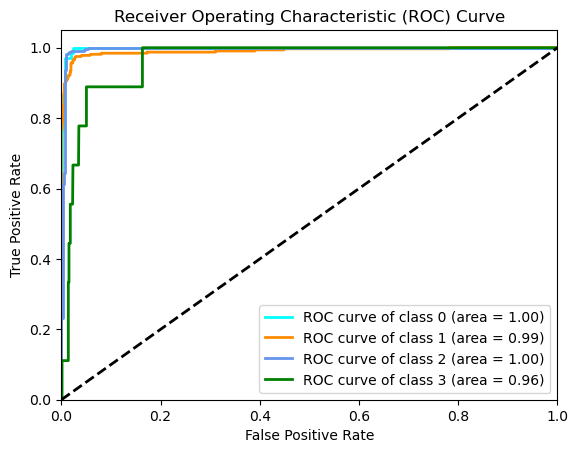

In [60]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from catboost import CatBoostClassifier, Pool
import matplotlib.pyplot as plt

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('LOAN_STATUS', axis=1)  # Replace 'LOAN_STATUS' with the name of your target column
    y = df['LOAN_STATUS']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

# Preprocess data
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train CatBoost model
catboost_model = CatBoostClassifier(random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)

# Evaluate model
y_pred = catboost_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, catboost_model.predict_proba(X_test), multi_class='ovr')

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = len(np.unique(y))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, catboost_model.predict_proba(X_test)[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


# LSTM

C:\Users\Daveee\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.4536 - loss: 1.2971 - val_accuracy: 0.6851 - val_loss: 0.9115
Epoch 2/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.9093 - loss: 0.4331 - val_accuracy: 0.6693 - val_loss: 0.8700
Epoch 3/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - accuracy: 0.9818 - loss: 0.0996 - val_accuracy: 0.6851 - val_loss: 0.8558
Epoch 4/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - accuracy: 0.9932 - loss: 0.0428 - val_accuracy: 0.6964 - val_loss: 0.8541
Epoch 5/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - accuracy: 0.9936 - loss: 0.0280 - val_accuracy: 0.7076 - val_loss: 0.8579
Epoch 6/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - accuracy: 0.9949 - loss: 0.0201 - val_accuracy: 0.7069 - val_loss: 0.8568
Epoch 7/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - accuracy: 0.9952 - loss: 0.0167 - val_accuracy: 0.7122 - val_loss: 0.8557
Epoch 8/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.9948 - loss: 0.0144 - val

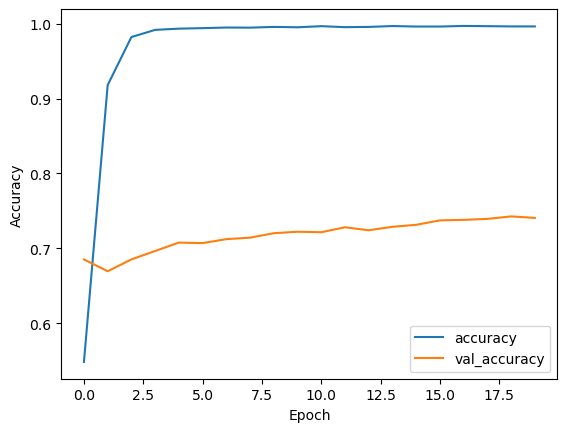

In [51]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('LOAN_STATUS', axis=1)  # Replace 'LOAN_STATUS' with the name of your target column
    y = df['LOAN_STATUS']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Assuming df is already loaded
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape input data for LSTM
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define LSTM model
model = Sequential([
    LSTM(units=50, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(units=4, activation='softmax')  # Assuming 4 classes for LOAN_STATUS
])

# Compile model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

# Evaluate model
y_pred = np.argmax(model.predict(X_test), axis=-1)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

# Plot training history
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

# Multi-Layer Perceptron (MLP) neural network (MLPNN)

C:\Users\Daveee\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - accuracy: 0.8031 - loss: 0.5783 - val_accuracy: 0.9076 - val_loss: 0.2775
Epoch 2/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.9798 - loss: 0.0588 - val_accuracy: 0.8944 - val_loss: 0.3091
Epoch 3/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.9922 - loss: 0.0185 - val_accuracy: 0.8924 - val_loss: 0.3120
Epoch 4/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.9926 - loss: 0.0152 - val_accuracy: 0.8931 - val_loss: 0.3159
Epoch 5/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.9946 - loss: 0.0100 - val_accuracy: 0.9003 - val_loss: 0.3004
Epoch 6/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.9938 - loss: 0.0109 - val_accuracy: 0.8977 - val_loss: 0.3014
Epoch 7/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.9939 - loss: 0.0100 - val_accuracy: 0.8937 - val_loss: 0.3143
Epoch 8/20
190/190 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.9970 - loss: 0.0072 - val_accu

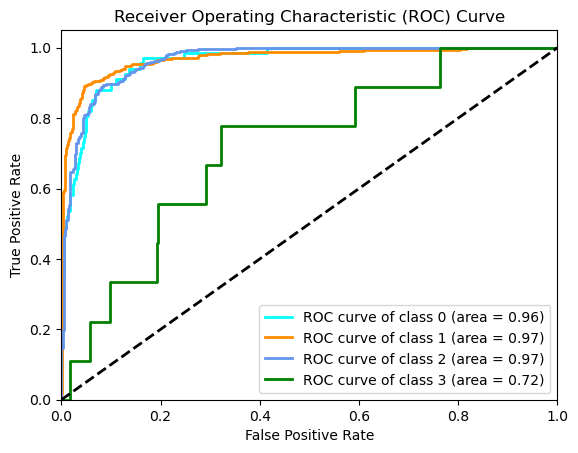

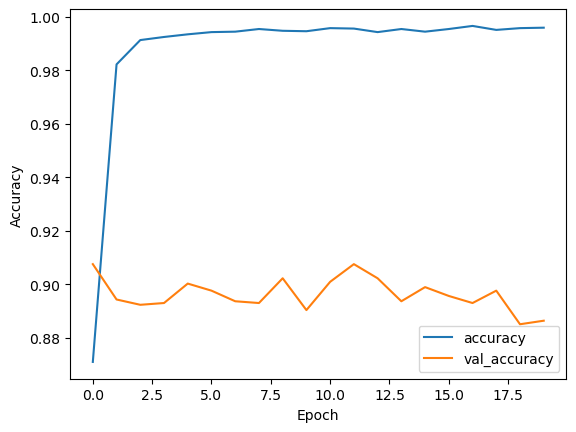

In [53]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('LOAN_STATUS', axis=1)  # Replace 'LOAN_STATUS' with the name of your target column
    y = df['LOAN_STATUS']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Assuming df is already loaded
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define MLP model
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(4, activation='softmax')  # Assuming 4 classes for LOAN_STATUS
])

# Compile model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

# Evaluate model
y_probs = model.predict(X_test)
y_pred = np.argmax(y_probs, axis=-1)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# ROC AUC
roc_auc = roc_auc_score(y_test, y_probs, multi_class='ovr')

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve (adapt for multi-class if needed)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(np.unique(y))):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
for i, color in zip(range(len(np.unique(y))), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Plot training history
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()


## Model Expalnantion using Exaplanable AI such as:
- SHAP (SHapley Additive exPlanations) and
- LIME (Local Interpretable Model-agnostic Explanations)

# XGBoost XAI =Best Performed 

Columns with non-numeric values: []


100%|===================| 6034/6060 [02:02<00:00]        C:\Users\Daveee\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\Daveee\anaconda3\Lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


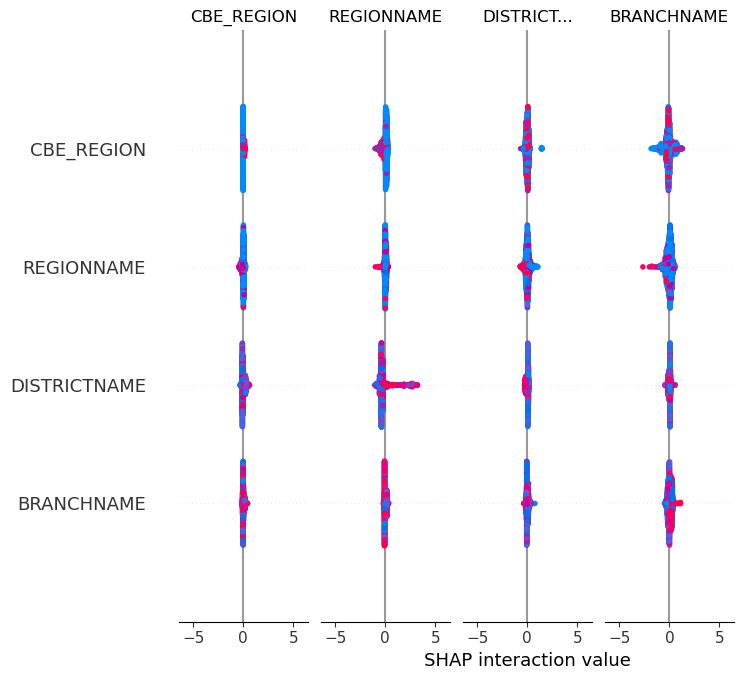

In [44]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
import shap
from lime.lime_tabular import LimeTabularExplainer

# Assuming df is your DataFrame containing the data
# Example: df = pd.DataFrame(...)

# List columns with non-numeric values
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Print columns with non-numeric values
print(f"Columns with non-numeric values: {categorical_columns}")

# Handle categorical columns with LabelEncoder or OneHotEncoder as needed
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

# Split data into features and target variable
X = df.drop(columns=['LOAN_STATUS'])
y = df['LOAN_STATUS']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Verify if there are any remaining categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns.tolist()
if categorical_columns:
    raise ValueError(f"Columns {categorical_columns} still have non-numeric values.")

# Train a machine learning model (e.g., XGBoost Classifier)
model = XGBClassifier(objective='multi:softmax', num_class=4)
model.fit(X_train, y_train)

# Initialize SHAP explainer with the trained model
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for test data
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values
shap.summary_plot(shap_values, X_test)

# Initialize LIME explainer
lime_explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, mode='classification')

# Explain individual predictions using LIME
instance_to_explain = X_test.iloc[6]
explanation = lime_explainer.explain_instance(instance_to_explain, model.predict_proba)

# Visualize LIME explanation
explanation.show_in_notebook()

# # Training XAI on the best performed  

In [50]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
import shap
from lime.lime_tabular import LimeTabularExplainer
from IPython.core.display import display, HTML

# Assuming df is your DataFrame containing the data
# Example: df = pd.DataFrame(...)

# List columns with non-numeric values
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Print columns with non-numeric values
print(f"Columns with non-numeric values: {categorical_columns}")

# Handle categorical columns with LabelEncoder or OneHotEncoder as needed
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

# Split data into features and target variable
X = df.drop(columns=['LOAN_STATUS'])
y = df['LOAN_STATUS']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Verify if there are any remaining categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns.tolist()
if categorical_columns:
    raise ValueError(f"Columns {categorical_columns} still have non-numeric values.")

# Train a machine learning model (e.g., XGBoost Classifier)
model = XGBClassifier(objective='multi:softmax', num_class=4)
model.fit(X_train, y_train)

# Initialize SHAP explainer with the trained model
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for test data
shap_values = explainer.shap_values(X_test)

# Initialize LIME explainer
lime_explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, mode='classification')

# Explain individual predictions using LIME
instance_to_explain = X_test.iloc[6]
explanation = lime_explainer.explain_instance(instance_to_explain, model.predict_proba, labels=(0, 1, 2, 3), top_labels=4)

# Customizing LIME explanation to show class colors
def lime_html_with_class_colors(explanation, class_names):
    exp = explanation.as_html()
    for i, class_name in enumerate(class_names):
        color = f"background-color: {lime_explainer.class_names[i]};"  # Assuming lime_explainer.class_names is defined
        exp = exp.replace(f'class="{i}"', f'class="{i}" style="{color}"')
    return exp

# Display LIME explanation with colored bars for each class
display(HTML(lime_html_with_class_colors(explanation, lime_explainer.class_names)))

C:\Users\Daveee\AppData\Local\Temp\ipykernel_8008\590603870.py:7: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


Columns with non-numeric values: []


100%|===================| 6036/6060 [02:02<00:00]        

In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
import shap
from lime.lime_tabular import LimeTabularExplainer
from IPython.core.display import display, HTML
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing the data
# Example: df = pd.DataFrame(...)

# List columns with non-numeric values
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Print columns with non-numeric values
print(f"Columns with non-numeric values: {categorical_columns}")

# Handle categorical columns with LabelEncoder or OneHotEncoder as needed
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

# Split data into features and target variable
X = df.drop(columns=['LOAN_STATUS'])
y = df['LOAN_STATUS']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Verify if there are any remaining categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns.tolist()
if categorical_columns:
    raise ValueError(f"Columns {categorical_columns} still have non-numeric values.")

# Train a machine learning model (e.g., XGBoost Classifier)
model = XGBClassifier(objective='multi:softmax', num_class=4)
model.fit(X_train, y_train)

# Initialize SHAP explainer with the trained model
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for test data
shap_values = explainer.shap_values(X_test)

# Initialize LIME explainer
lime_explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, mode='classification')

# Define a custom predict function for LIME
def custom_predict_proba(X):
    # Use model.predict_proba to get probabilities for each class
    probas = model.predict_proba(X)
    return probas

# Explain individual predictions using LIME
instance_to_explain = X_test.iloc[0].values.reshape(1, -1)  # Ensure proper shape
explanation = lime_explainer.explain_instance(instance_to_explain[0], custom_predict_proba, labels=(0, 1, 2, 3), top_labels=4)

# Customizing LIME explanation to show class colors and keys
def lime_html_with_class_colors(explanation, class_names, class_keys):
    exp = explanation.as_html()
    for i, class_name in enumerate(class_names):
        key = class_keys[i]
        color = f"background-color: {class_name};"  # Assuming class_names are colors
        exp = exp.replace(f'class="{i}"', f'class="{key}" style="{color}"')
    return exp

# Display LIME explanation with colored bars for each class
class_keys = ['Class 0', 'Class 1', 'Class 2', 'Class 3']  # Replace with actual keys/names
display(HTML(lime_html_with_class_colors(explanation, lime_explainer.class_names, class_keys)))

# Customizing SHAP summary plot to show colors for each class and keys
def shap_summary_plot_with_class_colors(shap_values, features, class_names, class_keys):
    fig, ax = plt.subplots()
    shap.summary_plot(shap_values, features, plot_type='bar', class_names=class_names, show=False, plot_size=(12, 6))
    ax.set_title('SHAP Summary Plot with Class-specific Colors')
    legend_handles = [plt.Line2D([0, 1], [0, 0], color=color, linewidth=3, linestyle='-') for color in class_names]
    ax.legend(legend_handles, class_keys, loc='upper right')
    plt.show()

# # Display SHAP summary plot with class-specific colors and keys
# class_keys_shap = ['Class 0', 'Class 1', 'Class 2', 'Class 3']  # Replace with actual keys/names
# shap_summary_plot_with_class_colors(shap_values, X_test, class_keys_shap, class_keys_shap)


C:\Users\Daveee\AppData\Local\Temp\ipykernel_7292\3108834119.py:7: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


Columns with non-numeric values: ['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME', 'TENURE', 'TERM', 'LOAN_TYPE', 'LOAN_DESCRIPTION', 'LOAN_PRODUCT', 'LTYPE', 'CUST_SHORTNAME', 'DAO_NAME', 'LOAN_STATUS', 'RISK_GRADE', 'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT', 'PRODUCT_OWNER', 'COLLATTERAL']


100%|===================| 6052/6060 [01:08<00:00]        

In [11]:
import lime
import lime.lime_tabular
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
# Split data into features and target variable
X = df.drop(columns=['LOAN_STATUS'])
y = df['LOAN_STATUS']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train an XGBoost model
model_xgb = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model_xgb.fit(X_train, y_train)

# Initialize the LimeTabularExplainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names=["0", "1", "2", "3"]
)

# Define the rows you want to explain
rows_to_explain = [0, 1, 2]  # Example rows, adjust as needed

# Generate explanations for the selected rows
for i in rows_to_explain:
    print("For row:", i, "the real value is", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i].values, model_xgb.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)


For row: 0 the real value is 1


For row: 1 the real value is 2


For row: 2 the real value is 1


## Save label encoders

In [21]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
import pickle

from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import joblib

# Load your data
# data = pd.read_csv('your_training_data.csv')

# Dictionary to hold label encoders
label_encoders = {}

# Encode categorical columns
for column in df.select_dtypes(include=['object']).columns:
    label_encoder = LabelEncoder()
    df[column] = label_encoder.fit_transform(df[column])
    label_encoders[column] = label_encoder

# Save the label encoders to disk
with open('label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)

# Ensure all features are numeric and convert to numpy array
features = df.drop('LOAN_STATUS', axis=1).values.astype(np.float32)
target = df['LOAN_STATUS'].values

# Train your model
Loan_status_model = xgb.XGBClassifier()
Loan_status_model.fit(features, target)

# # Save the model
# Loan_status_model.save_model('loan_status_model.json')
# new_data.values.astype(np.float32)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

# Save XGB_model 

In [22]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import joblib

# random seed
seed = 42

# Read original dataset
# df = pd.read_csv("C:/Users/Daveee/Desktop/Python apps/Iris_stremalit - Copy/data.csv")
df.sample(frac=1, random_state=seed)  # Shuffle dataframe

# Example of columns that need encoding
categorical_columns = ['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME', 'TENURE', 'TERM',
                       'LOAN_TYPE', 'LOAN_DESCRIPTION', 'LOAN_PRODUCT', 'LTYPE', 'CUST_SHORTNAME',
                       'DAO_NAME', 'RISK_GRADE', 'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP',
                       'SECTOR', 'TERM_OF_PAYMENT', 'PRODUCT_OWNER', 'COLLATTERAL']

# Encode categorical columns
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save the encoder for future use if needed

# Encode target variable
le_target = LabelEncoder()
df['LOAN_STATUS'] = le_target.fit_transform(df['LOAN_STATUS'])
label_encoders['LOAN_STATUS'] = le_target

# selecting features and target data
X = df[['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME',
       'APPROVED_AMOUNT', 'TENURE', 'TERM', 'LOAN_TYPE', 'LOAN_DESCRIPTION',
       'LOAN_PRODUCT', 'LTYPE', 'CUST_SHORTNAME', 'DAO_NAME', 'PRINCIPAL_OS',
       'INTEREST_OS', 'PRINCIPAL_ARREARS', 'INTEREST_ARREARS',
       'CURRENT_COMMITTMENT', 'INSTALLMENT_AMOUNT',
       'INSTALLMENT_FREQ_PRINCIPAL', 'INSTALLMENT_FREQ_INTEREST', 'RISK_GRADE',
       'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT',
       'PRODUCT_OWNER', 'COLLATTERAL', 'COLLATERAL_VALUE']]
y = df['LOAN_STATUS']

# split data into train and test sets
# 80% training and 20% test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=seed, stratify=y)

# create an instance of the XGBoost classifier
clf = XGBClassifier(objective='multi:softmax', num_class=len(df['LOAN_STATUS'].unique()), random_state=seed)

# train the classifier on the training data
clf.fit(X_train, y_train)

# predict on the test set
y_pred = clf.predict(X_test)

# calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# save the model and label encoders individually
joblib.dump(clf, "Loan_Status_xgb_model.sav")



Accuracy: 0.9828382838283828


['Loan_Status_xgb_model.sav']

In [23]:
df.columns

Index(['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME',
       'APPROVED_AMOUNT', 'TENURE', 'TERM', 'LOAN_TYPE', 'LOAN_DESCRIPTION',
       'LOAN_PRODUCT', 'LTYPE', 'CUST_SHORTNAME', 'DAO_NAME', 'PRINCIPAL_OS',
       'INTEREST_OS', 'LOAN_STATUS', 'PRINCIPAL_ARREARS', 'INTEREST_ARREARS',
       'CURRENT_COMMITTMENT', 'INSTALLMENT_AMOUNT',
       'INSTALLMENT_FREQ_PRINCIPAL', 'INSTALLMENT_FREQ_INTEREST', 'RISK_GRADE',
       'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT',
       'PRODUCT_OWNER', 'COLLATTERAL', 'COLLATERAL_VALUE'],
      dtype='object')

In [8]:
df['INSTALLMENT_AMOUNT'].value_counts()

INSTALLMENT_AMOUNT
0.000000e+00    1352
1.000000e+00     163
1.000000e+00     137
7.132804e-01     109
8.406277e-01      96
                ... 
5.849828e-01       1
1.392691e-15       1
5.608778e-15       1
1.395832e-11       1
2.379717e-11       1
Name: count, Length: 4594, dtype: int64

In [42]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import joblib
import pickle
import numpy as np

# Random seed
seed = 42

# Read original dataset
# df = pd.read_csv("C:/Users/Daveee/Desktop/Python apps/Iris_stremalit - Copy/data.csv")
df.sample(frac=1, random_state=seed)  # Shuffle dataframe

# Example of columns that need encoding
categorical_columns = ['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME', 'TENURE', 'TERM',
                       'LOAN_TYPE', 'LOAN_DESCRIPTION', 'LOAN_PRODUCT', 'LTYPE', 'CUST_SHORTNAME',
                       'DAO_NAME', 'RISK_GRADE', 'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP',
                       'SECTOR', 'TERM_OF_PAYMENT', 'PRODUCT_OWNER', 'COLLATTERAL']

# Encode categorical columns
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save the encoder for future use if needed

# Encode target variable
le_target = LabelEncoder()
df['LOAN_STATUS'] = le_target.fit_transform(df['LOAN_STATUS'])
label_encoders['LOAN_STATUS'] = le_target

# Selecting features and target data
X = df[['DISTRICTNAME', 'REGIONNAME', 'CBE_REGION', 'BRANCHNAME',
        'APPROVED_AMOUNT', 'TENURE', 'TERM', 'LOAN_TYPE', 'LOAN_DESCRIPTION',
        'LOAN_PRODUCT', 'LTYPE', 'CUST_SHORTNAME', 'DAO_NAME', 'PRINCIPAL_OS',
        'INTEREST_OS', 'PRINCIPAL_ARREARS', 'INTEREST_ARREARS',
        'CURRENT_COMMITTMENT', 'INSTALLMENT_AMOUNT',
        'INSTALLMENT_FREQ_PRINCIPAL', 'INSTALLMENT_FREQ_INTEREST', 'RISK_GRADE',
        'ECONOMIC_SECTOR', 'INDUSTRY', 'OWNERSHIP', 'SECTOR', 'TERM_OF_PAYMENT',
        'PRODUCT_OWNER', 'COLLATTERAL', 'COLLATERAL_VALUE']]
y = df['LOAN_STATUS']

# Split data into train and test sets
# 80% training and 20% test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=seed, stratify=y)

# Create an instance of the XGBoost classifier
clf = XGBClassifier(objective='multi:softmax', num_class=len(df['LOAN_STATUS'].unique()), random_state=seed)

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Save the model
joblib.dump(clf, "Loan_Status_xgb_model2.sav")

# Save all label encoders into one file
with open('label_encoders2.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)

Accuracy: 0.9828382838283828


In [33]:
df.dtypes

DISTRICTNAME                    int64
REGIONNAME                      int64
CBE_REGION                      int64
BRANCHNAME                      int64
APPROVED_AMOUNT               float64
TENURE                          int64
TERM                            int64
LOAN_TYPE                       int64
LOAN_DESCRIPTION                int64
LOAN_PRODUCT                    int64
LTYPE                           int64
CUST_SHORTNAME                  int64
DAO_NAME                        int64
PRINCIPAL_OS                  float64
INTEREST_OS                   float64
LOAN_STATUS                     int64
PRINCIPAL_ARREARS             float64
INTEREST_ARREARS              float64
CURRENT_COMMITTMENT           float64
INSTALLMENT_AMOUNT            float64
INSTALLMENT_FREQ_PRINCIPAL      int64
INSTALLMENT_FREQ_INTEREST       int64
RISK_GRADE                      int64
ECONOMIC_SECTOR                 int64
INDUSTRY                        int64
OWNERSHIP                       int64
SECTOR      

# Save MinMax scaler

In [7]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import pickle

# Load data from Excel file into a DataFrame
# file_path = 'your_file.xlsx'
# df = pd.read_excel(file_path)

# Identify numeric features
numeric_features = df.select_dtypes(include=['number']).columns.tolist()

# Initialize MinMaxScaler and fit on numeric features
scalers = {}
for feature in numeric_features:
    scaler = MinMaxScaler()
    df[feature] = scaler.fit_transform(df[[feature]])
    scalers[feature] = scaler

# Save MinMax scalers to a pickle file
output_file = 'minmax_scalers.pkl'
with open(output_file, 'wb') as f:
    pickle.dump(scalers, f)

print(f"MinMax scalers saved to {output_file}")


MinMax scalers saved to minmax_scalers.pkl


# ***Phase III***

## Model deployment on streamlit Python frameworks